In [1]:
# import google drive because that's where the files are stored
# from google.colab import drive  
# drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Disclaimer: The data used in this study cannot be published publicly, so to use the code please feel free to use your oen datasets (.pdf files of lecture notes/presentations)

To Check Memory and GPU usage

In [2]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.3 gigabytes of available RAM

You are using a high-RAM runtime!


In [3]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sun Sep 25 15:07:43 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [4]:
import warnings
warnings.filterwarnings('ignore')

Make installations of libraries and packages needed

In [5]:
!pip install pdfplumber
!pip install gensim
!pip install summa
!pip install wordcloud
!pip install Pillow
!pip install Counter
!pip install networkx

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [6]:
!pip install --upgrade numpy
!pip install --upgrade scipy
!pip install --upgrade pandas


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [7]:
!pip install matplotlib -qq
!pip install seaborn -qq
!pip install pyLDAvis -qq

This chunk will usually fail on the first run due to the WordCloud package not being utilised. 
Please run all again after the runtime stops for the first time.

In [8]:
import os
# os.kill(os.getpid(), 9)


try:
  from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
except (ImportError, KeyError, ModuleNotFoundError):
  ## code to install gem
  print("Stopping RUNTIME. Colaboratory will restart automatically. \nPlease \"Run All\" again to load WordCloud package.")
  os.kill(os.getpid(), 9)
  exit()

Import required libraries

In [9]:
import numpy as np
import pandas as pd
import itertools
from os import path
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

In [10]:
from nltk import ngrams,bigrams,trigrams
import collections as collect # collect.Counter()
import pdfplumber
import nltk
import networkx as nx
from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize, word_tokenize
import gensim
from gensim.utils import simple_preprocess
from gensim.models import LdaModel, LdaMulticore
from gensim import models
from gensim.models.phrases import Phrases
from gensim.models.phrases import Phraser
import re
import glob
import os
from tqdm.auto import tqdm
import numpy as np
from summa import summarizer
from summa import keywords  
from nltk.stem import SnowballStemmer
from nltk.stem import WordNetLemmatizer


In [11]:
import seaborn as sns
sns.set()
import pyLDAvis.gensim_models
pyLDAvis.enable_notebook()# Visualise inside a notebook
from gensim.models import CoherenceModel
# from wordcloud import WordCloud
from textblob import TextBlob
# import matplotlib.pyplot as plt
# %matplotlib inline

/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable


In [12]:
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

# Data Entry & Preprocessing

Extract the text from the pdf files and store into a string variable. Then append the strings of the respective pdf files into a list where each list element represents the words extracted from the pdf of a specific module. 

In [13]:
# function to extract files

def extract_files(file_directory, file_order, module_list):
  extracted_text = ""
  for current_pdf_file in tqdm(file_directory):
    file_order.append(os.path.relpath(current_pdf_file, "/Data"))
    with pdfplumber.open(current_pdf_file) as my_pdf:
      for page in my_pdf.pages:
        extracted_text  += page.extract_text()
        continue  
      module_list.append(extracted_text)  
      extracted_text = ""  
    
    
  print(file_order)

QDA - Quantitative Data Analysis

In [14]:
qda_files = glob.glob("/Data/QDA*.pdf")
qda_list = []
qda_file_order = []



extract_files(qda_files, qda_file_order, qda_list)

  0%|          | 0/9 [00:00<?, ?it/s]

['QDA1.pdf', 'QDA7.pdf', 'QDA6.pdf', 'QDA2.pdf', 'QDA3.pdf', 'QDA5.pdf', 'QDA4.pdf', 'QDA8.pdf', 'QDA9.pdf']


ML - Machine Learning 

In [15]:
ml_list = []
ml_file_order = []


ml_files = glob.glob("/Data/ML*.pdf")


extract_files(ml_files, ml_file_order, ml_list)

  0%|          | 0/9 [00:00<?, ?it/s]

['ML6.pdf', 'ML4.pdf', 'ML5.pdf', 'ML2.pdf', 'ML3.pdf', 'ML7.pdf', 'ML1.pdf', 'ML8.pdf', 'ML9.pdf']


AI - Artificial Intelligence

In [16]:
ai_list = []
ai_file_order = []


ai_files = glob.glob("/Data/AI*.pdf")

extract_files(ai_files, ai_file_order, ai_list)

  0%|          | 0/9 [00:00<?, ?it/s]

['AI7.pdf', 'AI4.pdf', 'AI5.pdf', 'AI6.pdf', 'AI2.pdf', 'AI3.pdf', 'AI1.pdf', 'AI8.pdf', 'AI9.pdf']


DL - Deep Learning

In [17]:
dl_list = []
dl_file_order = []


dl_files = glob.glob("/Data/DL*.pdf")


extract_files(dl_files, dl_file_order, dl_list)

  0%|          | 0/9 [00:00<?, ?it/s]

['DL3.pdf', 'DL4.pdf', 'DL6.pdf', 'DL5.pdf', 'DL2.pdf', 'DL1.pdf', 'DL8.pdf', 'DL9.pdf', 'DL7.pdf']





MD - Modern Data


In [18]:
md_list = []
md_file_order = []


md_files = glob.glob("/Data/MD*.pdf")


extract_files(md_files, md_file_order, md_list)

  0%|          | 0/9 [00:00<?, ?it/s]

['MD1.pdf', 'MD5.pdf', 'MD6.pdf', 'MD7.pdf', 'MD2.pdf', 'MD3.pdf', 'MD4.pdf', 'MD8.pdf', 'MD9.pdf']


RPM - Research Proj. Mgmt

In [19]:
rpm_list = []
rpm_file_order = []


rpm_files = glob.glob("/Data/RPM*.pdf")

extract_files(rpm_files, rpm_file_order, rpm_list)

  0%|          | 0/7 [00:00<?, ?it/s]

['RPM3.pdf', 'RPM2.pdf', 'RPM7.pdf', 'RPM6.pdf', 'RPM5.pdf', 'RPM4.pdf', 'RPM1.pdf']


# Data Cleaning

Remove the characters that are email addresses, web urls, pollev links and characters that are not alphabets, a newline character, or a space character. This is the first step of cleaning





In [20]:
def preprocess (module_list):
  module_list = [re.sub(re.compile('\S+@\S+'), '', document) for document in module_list] #removing email addresses
  module_list = [re.sub(re.compile('www.\S+'), '', document) for document in module_list]
  module_list = [re.sub(re.compile('(((https|http)):((//)|(\\\\))+([\w\d:#@%/;$()~_?\+-=\\\.&](#!)?)*)'), '', document) for document in module_list]#removing html tags
  module_list = [re.sub(re.compile('(((pollev)).(com)+(\/\S+)*)'), '', document) for document in module_list] #removing pollev.com tags
  module_list = [re.sub(r'[^a-zA-Z\n\s]','', document) for document in module_list]
  
  return module_list

<>:2: DeprecationWarning: invalid escape sequence \S
<>:3: DeprecationWarning: invalid escape sequence \S
<>:4: DeprecationWarning: invalid escape sequence \w
<>:5: DeprecationWarning: invalid escape sequence \/
<>:2: DeprecationWarning: invalid escape sequence \S
<>:3: DeprecationWarning: invalid escape sequence \S
<>:4: DeprecationWarning: invalid escape sequence \w
<>:5: DeprecationWarning: invalid escape sequence \/
<>:2: DeprecationWarning: invalid escape sequence \S
<>:3: DeprecationWarning: invalid escape sequence \S
<>:4: DeprecationWarning: invalid escape sequence \w
<>:5: DeprecationWarning: invalid escape sequence \/
<ipython-input-20-816b35656203>:2: DeprecationWarning: invalid escape sequence \S
  module_list = [re.sub(re.compile('\S+@\S+'), '', document) for document in module_list] #removing email addresses
<ipython-input-20-816b35656203>:3: DeprecationWarning: invalid escape sequence \S
  module_list = [re.sub(re.compile('www.\S+'), '', document) for document in module_

For QDA

In [21]:
qdaCorpus = []
qdaCorpus = preprocess (qda_list)

For ML

In [22]:
mlCorpus = []
mlCorpus = preprocess (ml_list)

For AI

In [23]:
aiCorpus = []
aiCorpus = preprocess (ai_list)

For DL

In [24]:
dlCorpus = []
dlCorpus = preprocess (dl_list)

For MD

In [25]:
mdCorpus = []
mdCorpus = preprocess (md_list)

For RPM


In [26]:
rpmCorpus = []
rpmCorpus = preprocess (rpm_list)

In [27]:
len(aiCorpus)

9

In [29]:
# store the set of english stopwords from nltk as a variable to be used later

stop_words = set(stopwords.words('english'))


# create sets of certain words to remove
# this includes months of the year and certain words that appear 
# frequently in slides but don't have much to do with the meaning behind the document
# The extra gibberish-looking characters were retroactively added

calendar_months = {'january', 'february', 'march', 'april', 'may', 'june', 'july', 'august', 'september', 'october', 'november', 'december'}
specific_stopwords =calendar_months | {'lecture', 'also','isabel','sassoon', 'isabelsassoon', 'yongmin','li','martin','shepperd','weibo','liu',
                                       'george','ghinea', 'jeff','wen','session','zhigang','monica', 'pereira', 'alessandro', 'pandini',
                                       'outline','contents','ian','blackman','xiaohui','dr','prof', 'atilla','abbasatilla',
                                       'hung-yi', 'lee', 'yi', 'hung', 'cmdscaledisthhv','hungyi', 'arxiv',
                                       'department of computer science','departmentofcomputerscience','lecturer','overview',
                                       'ieeeehhaa', 'mmssttggllii', 'eeccaaaa', 'oossyyccccuu', 'oollttuullrrhhuuuuffsseeaattttss', 'cceeeetteerreenniinnttrriiggiirrnne', 
                                       'iimmaagge', 'ssttrrfuuinccattluu', 'rerrseeult', 'histossriirrddeeicppaaeegga', 'aanniilggoottttreeiinniiffennaayyssse', 'uaaoo', 'lbbssnnfft', 'sddiiiippnnnn', 
                                       'iiggttxxddeerreerrooiilleennssuussggpptt', 'eevvhhbbnniiaasshhiittddnnooaaddeerrnniiiiccrrnncc', 'aaeeggssll', 'pppbbboooaaacccccccccsssooollleeekkktttmmmaaaggg', 
                                       'pppnnnrrrpppooorrr', 'eeeuuuuuuooonnnpppnnncccsss', 'dddiiiaaaeeemmm', 'tttnnnssseeeaaaooosss', 'gggfffiiisssiiioooeeennneeerrr', 'iorm', 'tequeequ', 'iiaammccaaqqgguueeiirr', 
                                       'eeiinn', 'hhffooiiggrrmmhh', 'aalleettiivvooeennl', 'xxxx','xxxxxxxxx',
                                       'iimmaaccaaqqgguueeiirr', 'iieenn', 'fflloooorrwwmm', 'llaaeettvviiooeennl', 'fffiiinnnaaall', 'aaannnaaalllyyysssiiisss', 'imaima', 'ansfansfequirequirsubssub',
                                       'iitt', 'xxiiyyii', 'llaatteexxiitt', 
                                       'sshhaabbaasseeiiffxxzzhheebbccaaeeccjjoollrrllwwhhrruueehhmmaaaaaabbxxiiccbbvvbbllssggnnbbeekkxxggnnvvjjuuggoommqqqqcckkmmllnnqqzzccooppccrrqqllmmaakkwwhhqqsszzooeennqqggjjzzggmmooyyffxxccoonncceebbcceewwrruuxxyyeewwccnnooyykkppcchhvvvvvvffvvllgguuppxxvvqqyyllzzxxvvttffxxccrrnnzzaattnnbbrrssookkyyttwwssmmqqjjqqyywwooppwwjjwwttnnmmccqqmmjjccvvhhwwggkkjjggffyyppccaaqqssssuuiiccaaffttmmhhoohhggnnwwzzqqrrrriimmxxbbzzrrllqqbbhhmmqqccggppddcceerroobbggiirruuddnnsskknnvvvvbbwweekkbbooxxffjjqqiioovviipplluuvveessuuwwiixxwwoossqqeevvjjttaaaarruuggcchhxxsswwwwttyyffooxxccggddiikkkkaahhrrrrppkkeeffqqqqttqqmmttggeeiiddvvnneeppxxppvvoovvllzzeerrjjookkmmlluuttttjjsseerrrrhhggddppmmuuqqjjaaggggmmkkppllbbeeeelljjiiyykkyyeevvnnccooyyuukkffllyyllppoossuuhhzzggiibbddwwddeevvwwrrllkkccaammvvqqaaggbbiittzzccmmxxyymmffvvkkvvvvppvvyyllaazz',
                                       'iiyyii', 'line', 'llaatteexxiitt', 
                                       'sshhaabbaasseeddcccceeccmmxxooiixxrrqqjjmmssyynnggeeddaabbeeggqqaaaaaabbxxiiccbbzzccssggnnbbffiibbppxxlluummttuubbqqaaddeeeehhccrrhhzzaabbmmwwssllbbiiwwffyywwzzxxyyyymmwwyyzznnvvmmzzssuullaallssbbsswwuussffuuxxffaammjjhhcchhiippnnpprrddwwmmffnnoocccckkeemmuuddppkkllsswwuullaakkvvwwttrrxxuubbwwbbttkkppffqqssssttmmiieeyyaaaaffeevvmmllppmmmmttnnwwiiiimmooaakkbbwweebbiinnddddvvqqvvqqssffttccssggxxzzggiissnnyygguummddooeezzyyttmmiiiizzmmqqjjbbxxccggxxyyppddqqrruuvvvvzzhhppxxuuttnnkkjjcceevvaarrttoooorrhhllppoorrttkkeeffttqqppooggsskkaajjbboommaarrvvddwwmmvveeiihhrrqqnniijjyymmiiccmmrrggooyyuuiiqqllaallmmzzyyddxxnnyyccrrppzzoozzmmjjkkmmmmggkkwwccllooooddiizzggmmuukkrroonnhhnnaarrddiizzkkyyjjllddhhrrkkggffccwwrrffuuwwddggppuuddllppyywwkkwwmmllyyddooiiaassuuhhaaggffbbiieekkttssbbggiiaahheeiijjnnssmmppoovvooiinnwwbbooeexxffggllbbppiiggttllggllaatteexxiitt', 'sshhaabbaasseeiiffxxzzhheebbccaaeeccjjoollrrllwwhhrruueehhmmaaaaaabbxxiiccbbvvbbllssggnnbbeekkxxggnnvvjjuuggoommqqqqcckkmmllnnqqzzccooppccrrqqllmmaakkwwhhqqsszzooeennqqggjjzzggmmooyyffxxccoonncceebbcceewwrruuxxyyeewwccnnooyykkppcchhvvvvvvffvvllgguuppxxvvqqyyllzzxxvvttffxxccrrnnzzaattnnbbrrssookkyyttwwssmmqqjjqqyywwooppwwjjwwttnnmmccqqmmjjccvvhhwwggkkjjggffyyppccaaqqssssuuiiccaaffttmmhhoohhggnnwwzzqqrrrriimmxxbbzzrrllqqbbhhmmqqccggppddcceerroobbggiirruuddnnsskknnvvvvbbwweekkbbooxxffjjqqiioovviipplluuvveessuuwwiixxwwoossqqeevvjjttaaaarruuggcchhxxsswwwwttyyffooxxccggddiikkkkaahhrrrrppkkeeffqqqqttqqmmttggeeiiddvvnneeppxxppvvoovvllzzeerrjjookkmmlluuttttjjsseerrrrhhggddppmmuuqqjjaaggggmmkkppllbbeeeelljjiiyykkyyeevvnnccooyyuukkffllyyllppoossuuhhzzggiibbddwwddeevvwwrrllkkccaammvvqqaaggbbiittzzccmmxxyymmffvvkkvvvvppvvyyllaazzzzzzaahhggvvffaacckkwwjjaallaatteexxiitt',
                                       'sshhaabbaasseeddcccceeccmmxxooiixxrrqqjjmmssyynnggeeddaabbeeggqqaaaaaabbxxiiccbbzzccssggnnbbffiibbppxxlluummttuubbqqaaddeeeehhccrrhhzzaabbmmwwssllbbiiwwffyywwzzxxyyyymmwwyyzznnvvmmzzssuullaallssbbsswwuussffuuxxffaammjjhhcchhiippnnpprrddwwmmffnnoocccckkeemmuuddppkkllsswwuullaakkvvwwttrrxxuubbwwbbttkkppffqqssssttmmiieeyyaaaaffeevvmmllppmmmmttnnwwiiiimmooaakkbbwweebbiinnddddvvqqvvqqssffttccssggxxzzggiissnnyygguummddooeezzyyttmmiiiizzmmqqjjbbxxccggxxyyppddqqrruuvvvvzzhhppxxuuttnnkkjjcceevvaarrttoooorrhhllppoorrttkkeeffttqqppooggsskkaajjbboommaarrvvddwwmmvveeiihhrrqqnniijjyymmiiccmmrrggooyyuuiiqqllaallmmzzyyddxxnnyyccrrppzzoozzmmjjkkmmmmggkkwwccllooooddiizzggmmuukkrroonnhhnnaarrddiizzkkyyjjllddhhrrkkggffccwwrrffuuwwddggppuuddllppyywwkkwwmmllyyddooiiaassuuhhaaggffbbiieekkttssbbggiiaahheeiijjnnssmmppoovvooiinnwwbboo',
                                       'mmmaaaggg', 'pppnnpppooorrr', 'eeeuuuuuuooonn','itthhaass', 'pppbbboooaaacccccccccsssooollleeekk','itthhaass', 'pppbbboooaaacccccccccsssooollleeekk','ussggpptt', 'eevvhhbbnniiaasshhiittddnnooaaddeerrn','aeeggssll', 'eerrssuueeaassppssiirraannuuccttg',
                                       'ussggpptt', 'eevvhhbbnniiaasshhiittddnnooaaddeerrn','aeeggssll', 'eerrssuueeaassppssiirraannuuccttgglliitthhaass','iiippnnnn', 'iiggttxxddeerreerrooiilleen',
                                       'learning outcomes', 'outcomes','agmorrreaacabhsdlsaeolrawdnd', 'refwildchrisjandmaxinepfannkuchstatisticalthinkinginempiricalenquiryinternationalstatistical', 
                                       'summary', 'references', 'cid','week','brunelacuk','th','st', 
                                       'brunel university london', 'bruneluniversitylondon', 'brunel', 'university', 'london'}


In [30]:
# Stemming

def stemFunc(stemCorpus):
  stemmer = SnowballStemmer('english')  
  stemmedWords = [
    [stemmer.stem(word) for word in corpora.lower().split() if word not in stop_words and word not in specific_stopwords and len(word) > 3]
    for corpora in stemCorpus
    ]
  return stemmedWords
  # print(stemmedWords)

In [31]:
# Lemmatization

def lemmFunc(lemmCorpus):
  lemmatizer = WordNetLemmatizer()

  lemmWords = [
    [lemmatizer.lemmatize(word) for word in corpora.lower().split() if word not in stop_words and word not in specific_stopwords and len(word) > 3]
    for corpora in lemmCorpus
    ]
  return lemmWords  
  # print(lemmWords)

In [32]:
qdaStem = stemFunc(qdaCorpus)
mlStem = stemFunc(mlCorpus)
aiStem = stemFunc(aiCorpus)
mdStem = stemFunc(mdCorpus)
dlStem = stemFunc(dlCorpus)
rpmStem = stemFunc(rpmCorpus)

In [33]:
qdaLemm = lemmFunc(qdaCorpus)
mlLemm = lemmFunc(mlCorpus)
aiLemm = lemmFunc(aiCorpus)
mdLemm = lemmFunc(mdCorpus)
dlLemm = lemmFunc(dlCorpus)
rpmLemm = lemmFunc(rpmCorpus)

# Representation methods

Bag of words


In [34]:
'''
Create a dictionary from 'processed_docs' containing the number of times a word appears 
in the training set using gensim.corpora.Dictionary and call it 'dictionary'
'''
# dictionary
qda_dict = gensim.corpora.Dictionary(qdaLemm)
md_dict = gensim.corpora.Dictionary(mdLemm)
ml_dict = gensim.corpora.Dictionary(mlLemm)
rpm_dict = gensim.corpora.Dictionary(rpmLemm)
ai_dict = gensim.corpora.Dictionary(aiLemm)
dl_dict = gensim.corpora.Dictionary(dlLemm)

In [35]:
'''
Function for checking dictionary created
'''
def check_dict(dictionary):  
  count = 0
  for k, v in dictionary.iteritems():
      print(k, v)
      count += 1
      if count > 30:
          break

In [36]:
'''
Create the Bag-of-words model for each document i.e for each document we create a dictionary reporting how many
words and how many times those words appear. Save this to 'bow_corpus'
'''
def bag_of_words(dictionary, lemmatizedWords):
  bow_corpus = [dictionary.doc2bow(doc) for doc in lemmatizedWords]

  return bow_corpus

In [37]:
# bow_corpus
qda_bow = bag_of_words(qda_dict, qdaLemm)
md_bow = bag_of_words(md_dict , mdLemm)
ml_bow = bag_of_words(ml_dict, mlLemm)
rpm_bow = bag_of_words(rpm_dict , rpmLemm)
ai_bow = bag_of_words(ai_dict , aiLemm )
dl_bow = bag_of_words(dl_dict, dlLemm )

TF-IDF


In [38]:
# Word weight in Bag of Words corpus
def word_weight(bow_corpus, dictionary):
  weight_of_word =[]
  for doc in bow_corpus:
    for id, freq in doc:
      weight_of_word.append([dictionary[id], freq])
  return weight_of_word

In [39]:
qda_weight = word_weight(qda_bow, qda_dict)
ml_weight = word_weight(ml_bow, ml_dict)
rpm_weight = word_weight(rpm_bow, rpm_dict)
dl_weight = word_weight(dl_bow, dl_dict)
ai_weight = word_weight(ai_bow, ai_dict)
md_weight = word_weight(md_bow, md_dict)

In [40]:
# type(rpm_weight)

In [41]:
# function to calculate tf-idf word weight
def tfidf_word_weight(tfidf,bow_corpus,dictionary):
  weight_tfidf =[]
  for doc in tfidf[bow_corpus]:
    for id, freq in doc:
      weight_tfidf.append([dictionary[id], np.around(freq, decimals = 3)])
  print(weight_tfidf)

In [42]:
# create tf-idf model
qda_tf_idf = gensim.models.TfidfModel(qda_bow, smartirs ='ntc')

qda_tf_weight = tfidf_word_weight(qda_tf_idf,qda_bow,qda_dict)

[['achieving', 0.025], ['actually', 0.017], ['aected', 0.025], ['afternoon', 0.001], ['analysed', 0.025], ['analysing', 0.012], ['andor', 0.012], ['another', 0.013], ['answer', 0.011], ['answered', 0.001], ['appear', 0.025], ['approach', 0.006], ['appropriate', 0.017], ['arable', 0.198], ['area', 0.037], ['around', 0.025], ['artefact', 0.025], ['articulating', 0.025], ['ashurst', 0.05], ['asked', 0.009], ['aspect', 0.009], ['ass', 0.012], ['assuming', 0.009], ['attribute', 0.037], ['average', 0.025], ['aware', 0.025], ['best', 0.025], ['better', 0.009], ['beyond', 0.025], ['binary', 0.018], ['book', 0.012], ['build', 0.001], ['calculated', 0.025], ['called', 0.007], ['case', 0.003], ['categorical', 0.059], ['category', 0.074], ['central', 0.025], ['chance', 0.012], ['change', 0.012], ['chart', 0.198], ['chateld', 0.025], ['check', 0.006], ['child', 0.085], ['churchfield', 0.05], ['circumstance', 0.025], ['class', 0.025], ['clean', 0.017], ['collect', 0.034], ['collecting', 0.025], ['co

In [43]:
ml_tf_idf = gensim.models.TfidfModel(ml_bow, smartirs ='ntc')

ml_tf_weight = tfidf_word_weight(ml_tf_idf, ml_bow, ml_dict)

[['absolute', 0.011], ['activation', 0.087], ['advantage', 0.006], ['algorithm', 0.016], ['assumption', 0.011], ['backpropagation', 0.065], ['backward', 0.043], ['best', 0.006], ['bias', 0.074], ['binary', 0.006], ['calculate', 0.022], ['classication', 0.004], ['close', 0.043], ['complex', 0.015], ['computationally', 0.015], ['compute', 0.015], ['connected', 0.059], ['convergencesupervised', 0.022], ['convolutional', 0.015], ['cycle', 0.087], ['derivative', 0.022], ['descent', 0.043], ['diet', 0.195], ['disadvantage', 0.008], ['easily', 0.011], ['education', 0.134], ['efully', 0.022], ['epoch', 0.087], ['error', 0.064], ['evaluation', 0.006], ['example', 0.008], ['exercise', 0.134], ['expectancy', 0.26], ['explainedinterpreted', 0.011], ['feature', 0.003], ['forward', 0.065], ['function', 0.048], ['functionneuron', 0.022], ['gaussian', 0.022], ['genetics', 0.217], ['geneticsnon', 0.087], ['given', 0.043], ['go', 0.087], ['goal', 0.03], ['gradient', 0.022], ['grid', 0.065], ['gridselfor

In [44]:
ai_tf_idf = gensim.models.TfidfModel(ai_bow, smartirs ='ntc')

ai_tf_weight = tfidf_word_weight(ai_tf_idf, ai_bow, ai_dict)

[['accumulate', 0.023], ['accurate', 0.033], ['acrobat', 0.023], ['actor', 0.023], ['adapt', 0.033], ['adobe', 0.023], ['advance', 0.033], ['affective', 0.033], ['agency', 0.033], ['aggressive', 0.033], ['alien', 0.023], ['aligncrosslingual', 0.033], ['allocation', 0.023], ['always', 0.012], ['amnesty', 0.023], ['analysis', 0.123], ['answering', 0.033], ['answeringunified', 0.033], ['application', 0.05], ['applicationssentiment', 0.033], ['applied', 0.017], ['apply', 0.012], ['area', 0.033], ['arm', 0.023], ['assign', 0.017], ['assumption', 0.017], ['attention', 0.033], ['authorship', 0.033], ['automatic', 0.023], ['available', 0.033], ['base', 0.012], ['bayes', 0.066], ['bert', 0.066], ['best', 0.017], ['better', 0.023], ['bgeneral', 0.033], ['bold', 0.023], ['booster', 0.023], ['build', 0.045], ['called', 0.006], ['cant', 0.033], ['categorisation', 0.033], ['chang', 0.033], ['change', 0.05], ['changed', 0.033], ['changing', 0.017], ['character', 0.045], ['choice', 0.023], ['class', 0

In [45]:
md_tf_idf = gensim.models.TfidfModel(md_bow, smartirs ='ntc')

md_tf_weight = tfidf_word_weight(md_tf_idf, md_bow, md_dict)

[['abbas', 0.032], ['able', 0.012], ['access', 0.016], ['action', 0.017], ['activity', 0.032], ['advantage', 0.032], ['agenda', 0.004], ['ahmed', 0.032], ['allows', 0.032], ['already', 0.016], ['alternatively', 0.012], ['analyse', 0.012], ['analyst', 0.022], ['appreciation', 0.032], ['approach', 0.035], ['assign', 0.032], ['atomic', 0.063], ['attribute', 0.022], ['availability', 0.032], ['available', 0.006], ['aware', 0.004], ['background', 0.016], ['basic', 0.034], ['blackboard', 0.063], ['book', 0.042], ['called', 0.022], ['capabilies', 0.032], ['case', 0.017], ['challenge', 0.012], ['chapter', 0.025], ['character', 0.035], ['chat', 0.004], ['cheatsheet', 0.022], ['checklist', 0.063], ['clean', 0.022], ['code', 0.017], ['coercion', 0.032], ['collect', 0.032], ['combine', 0.032], ['community', 0.016], ['completed', 0.095], ['complex', 0.016], ['concept', 0.032], ['consider', 0.002], ['container', 0.022], ['continuing', 0.032], ['coupled', 0.032], ['course', 0.063], ['covid', 0.022], [

In [46]:
dl_tf_idf = gensim.models.TfidfModel(dl_bow, smartirs ='ntc')

dl_tf_weight = tfidf_word_weight(dl_tf_idf, dl_bow, dl_dict)

[['ability', 0.035], ['according', 0.035], ['activated', 0.048], ['activation', 0.059], ['actual', 0.106], ['adjustable', 0.035], ['adjustment', 0.035], ['advanced', 0.035], ['algorithm', 0.008], ['amount', 0.018], ['animal', 0.013], ['anns', 0.024], ['answer', 0.024], ['apple', 0.073], ['application', 0.016], ['applied', 0.009], ['apply', 0.002], ['army', 0.035], ['artificial', 0.076], ['assume', 0.024], ['attains', 0.024], ['attribute', 0.018], ['axon', 0.106], ['banana', 0.073], ['based', 0.018], ['basic', 0.013], ['bear', 0.024], ['becomes', 0.024], ['belong', 0.024], ['best', 0.013], ['better', 0.007], ['bias', 0.038], ['billion', 0.035], ['binary', 0.035], ['biological', 0.071], ['bird', 0.008], ['body', 0.035], ['boundary', 0.265], ['box', 0.024], ['brain', 0.318], ['brown', 0.013], ['calculate', 0.018], ['called', 0.052], ['cannot', 0.013], ['case', 0.019], ['category', 0.035], ['cell', 0.073], ['certain', 0.018], ['changed', 0.024], ['chapter', 0.002], ['chinese', 0.018], ['ci

In [47]:
rpm_tf_idf = gensim.models.TfidfModel(rpm_bow, smartirs ='ntc')

rpm_tf_weight = tfidf_word_weight(rpm_tf_idf, rpm_bow, rpm_dict)

[['able', 0.014], ['absorb', 0.033], ['academy', 0.033], ['accept', 0.033], ['accepted', 0.021], ['accepting', 0.021], ['achieve', 0.014], ['achieving', 0.033], ['action', 0.085], ['activity', 0.016], ['actual', 0.033], ['actually', 0.021], ['adding', 0.042], ['additional', 0.021], ['address', 0.009], ['agile', 0.064], ['alter', 0.033], ['alternative', 0.021], ['always', 0.006], ['among', 0.033], ['analyse', 0.021], ['analysing', 0.029], ['another', 0.029], ['applies', 0.033], ['applying', 0.033], ['approach', 0.008], ['approval', 0.042], ['approved', 0.066], ['area', 0.029], ['asian', 0.033], ['ass', 0.021], ['assessed', 0.009], ['assessment', 0.009], ['assignment', 0.021], ['association', 0.021], ['australia', 0.033], ['avoid', 0.003], ['back', 0.009], ['base', 0.033], ['based', 0.006], ['baseline', 0.33], ['basis', 0.019], ['bear', 0.033], ['become', 0.029], ['becomes', 0.033], ['beginning', 0.014], ['board', 0.066], ['brainstorming', 0.033], ['breakdown', 0.064], ['broad', 0.033], 

Bigrams and Trigrams

Bigrams

In [48]:
qdaBigram = Phrases(qdaLemm, min_count = 3, threshold = 10)
mdBigram = Phrases(mdLemm, min_count = 3, threshold = 10)
aiBigram = Phrases(aiLemm, min_count = 3, threshold = 10)
dlBigram = Phrases(dlLemm, min_count = 3, threshold = 10)
rpmBigram = Phrases(rpmLemm, min_count = 3, threshold = 10)
mlBigram = Phrases(mlLemm, min_count = 3, threshold = 10)


In [49]:
print(mdBigram[mdLemm[0]])

['introducing', 'modern_data', 'introduction', 'poll_please', 'mobile_computer', 'need', 'minute', 'thanks', 'introduction', 'welcome', 'continuing', 'challenge', 'covid', 'great', 'time', 'study', 'data_science', 'machine_learning', 'introduction', 'agenda', 'module', 'teaching', 'approach', 'resource', 'data', 'scientist', 'basic', 'getting', 'help', 'goal', 'extension', 'question', 'study', 'introduction', 'module', 'meet', 'team', 'professor', 'module', 'leader', 'professor', 'support', 'tasin', 'islam', 'ziyan', 'introduction', 'virtualphysical', 'protocol_start', 'prompt_please', 'ready_aware', 'lecture_seminar', 'recorded_please', 'mute_microphone', 'question_chat', 'facility_question', 'thumbsup_question', 'important_please', 'consider_wearing', 'mask', 'introduction', 'data', 'wisdom_crowd', 'introduction', 'whats', 'modern_data', 'provide', 'introduction', 'data', 'management', 'exploration', 'appreciation', 'richness', 'availability', 'different', 'data', 'source', 'techniqu

Trigrams

In [50]:
qdaTrigram = Phrases(qdaBigram[qdaLemm], threshold = 10)
dlTrigram = Phrases(dlBigram[dlLemm], threshold = 10)
aiTrigram = Phrases(aiBigram[aiLemm], threshold = 10)
mdTrigram = Phrases(mdBigram[mdLemm], threshold = 10)
rpmTrigram = Phrases(rpmBigram[rpmLemm], threshold = 10)
mlTrigram = Phrases(mlBigram[mlLemm], threshold = 10)

In [51]:
print(mdTrigram[mdBigram[mdLemm[0]]])

['introducing', 'modern_data', 'introduction', 'poll_please_mobile_computer', 'need', 'minute', 'thanks', 'introduction', 'welcome', 'continuing', 'challenge', 'covid', 'great', 'time', 'study', 'data_science', 'machine_learning', 'introduction', 'agenda', 'module', 'teaching', 'approach', 'resource', 'data', 'scientist', 'basic', 'getting', 'help', 'goal', 'extension', 'question', 'study', 'introduction', 'module', 'meet', 'team', 'professor', 'module', 'leader', 'professor', 'support', 'tasin', 'islam', 'ziyan', 'introduction', 'virtualphysical', 'protocol_start_prompt_please', 'ready_aware_lecture_seminar', 'recorded_please_mute_microphone', 'question_chat_facility_question', 'thumbsup_question_important_please', 'consider_wearing_mask', 'introduction', 'data', 'wisdom_crowd', 'introduction', 'whats', 'modern_data', 'provide', 'introduction', 'data', 'management', 'exploration', 'appreciation', 'richness', 'availability', 'different', 'data', 'source', 'technique', 'method', 'proces

Word2Vec

In [52]:
from multiprocessing import cpu_count
from gensim.models.word2vec import Word2Vec

In [57]:
def convert_w2v(lemmWords):
  w2v_model = Word2Vec(lemmWords, min_count = 0, workers = cpu_count())

  return w2v_model

In [58]:
import gensim.downloader as api
from gensim.matutils import softcossim
from gensim import corpora
import jieba

from gensim.models import Word2Vec

QDA

In [59]:
qda_w2v = convert_w2v(qdaLemm)


AI

In [60]:
ai_w2v = convert_w2v(aiLemm)

DL

In [61]:
dl_w2v = convert_w2v(dlLemm)

RPM

In [62]:
rpm_w2v = convert_w2v(rpmLemm)

ML

In [63]:
ml_w2v = convert_w2v(mlLemm)

MD

In [64]:
md_w2v = convert_w2v(mdLemm)

In [65]:
# print(w2v_model['statistical'])

In [66]:
# w1 = 'statistical'
# w2v_model.wv.most_similar(positive=w1, topn=12)

# EDA

Word Cloud


In [67]:
#@title
import io

/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/usr

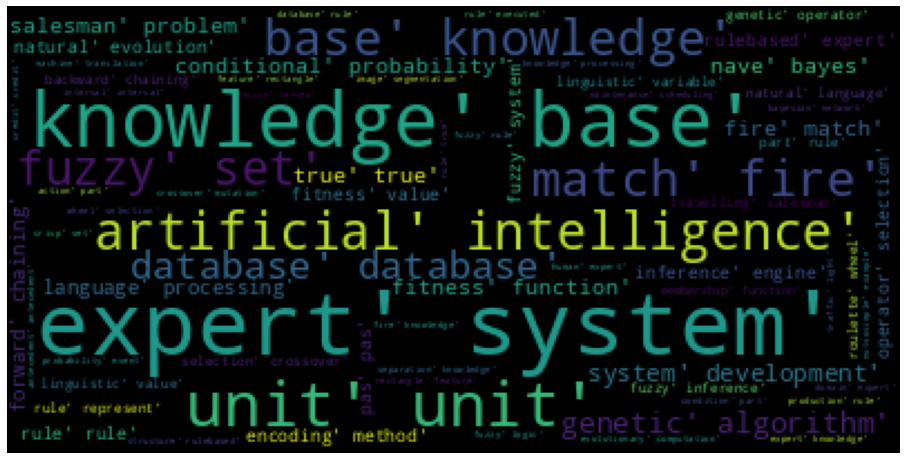

In [68]:
#@title
# AI word cloud

tplot = ''
for cat in aiLemm:
  cat = str(cat)
  tokens = cat.split()
  for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()
    tplot += " ".join(tokens)

word_cloud = WordCloud(collocations = False, 
                       width=1920, height = 1080,
                       background_color = 'white').generate(tplot)



plt.figure(figsize=(16, 16), facecolor = None)
plt.imshow(WordCloud().generate(tplot))
plt.axis('off')
# plt.show()

# plt.savefig("/Images/AIWC.png", format="png", dpi=1200)

word_cloud.to_file("/Images/AIWC.png")

/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/usr

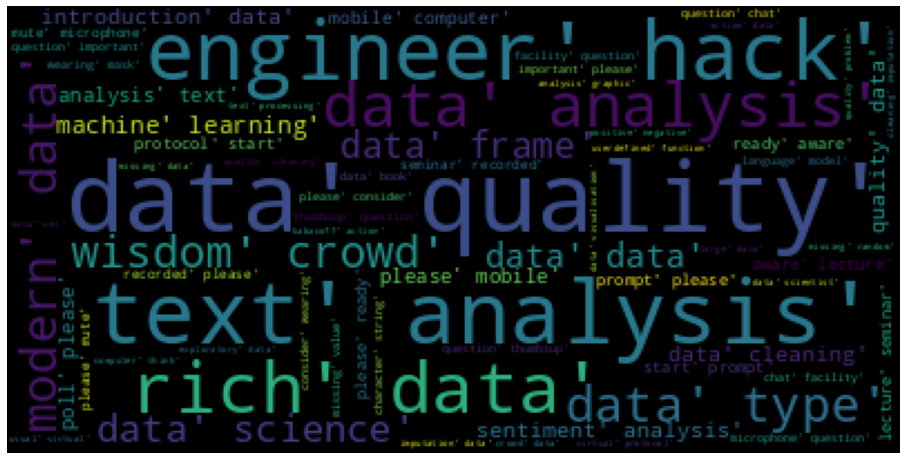

In [69]:
#@title
# MD word cloud

tplot = ''
for cat in mdLemm:
  cat = str(cat)
  tokens = cat.split()
  for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()
    tplot += " ".join(tokens)

word_cloud = WordCloud(collocations = False, 
                       width=1920, height = 1080,
                       background_color = 'white').generate(tplot)



plt.figure(figsize=(16, 16), facecolor = None)
plt.imshow(WordCloud().generate(tplot))
plt.axis('off')
# plt.show()

# plt.savefig("/Images/MDWC.png", format="png", dpi=1200)

word_cloud.to_file("/Images/MDWC.png")

/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/usr

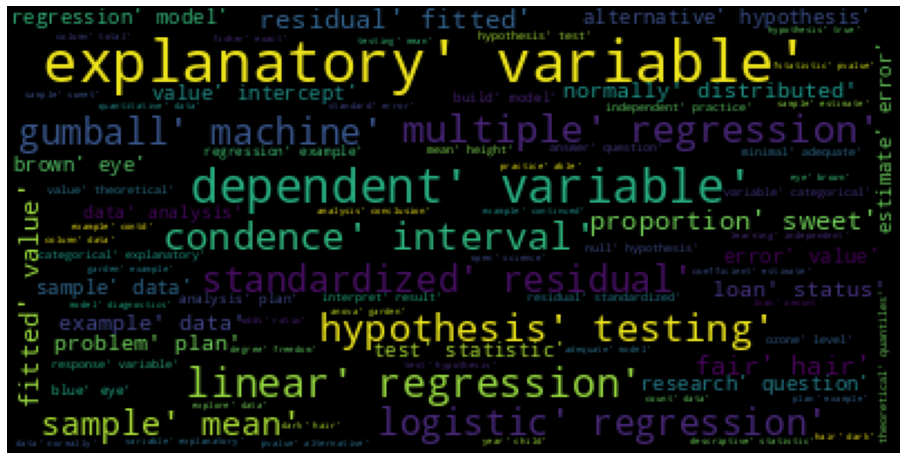

In [70]:
#@title
# QDA word cloud

tplot = ''
for cat in qdaLemm:
  cat = str(cat)
  tokens = cat.split()
  for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()
    tplot += " ".join(tokens)

word_cloud = WordCloud(collocations = False, 
                       width=1920, height = 1080,
                       background_color = 'white').generate(tplot)



plt.figure(figsize=(16, 16), facecolor = None)
plt.imshow(WordCloud().generate(tplot))
plt.axis('off')
# plt.show()

# plt.savefig("/Images/QDAWC.png", format="png", dpi=1200)

word_cloud.to_file("/Images/QDAWC.png")

/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/usr

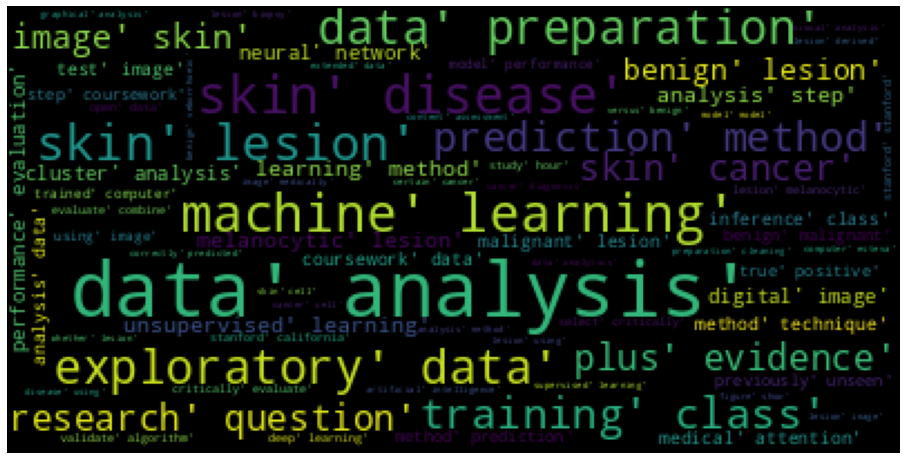

In [71]:
#@title
# ML word cloud

tplot = ''
for cat in mlLemm:
  cat = str(cat)
  tokens = cat.split()
  for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()
    tplot += " ".join(tokens)

word_cloud = WordCloud(collocations = False, 
                       width=1920, height = 1080,
                       background_color = 'white').generate(tplot)



plt.figure(figsize=(16, 16), facecolor = None)
plt.imshow(WordCloud().generate(tplot))
plt.axis('off')
# plt.show()

# plt.savefig("/Images/MLWC.png", format="png", dpi=1200)

word_cloud.to_file("/Images/MLWC.png")

/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = Image.ROTATE_90
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:520: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  Image.ROTATE_90)
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: Depr

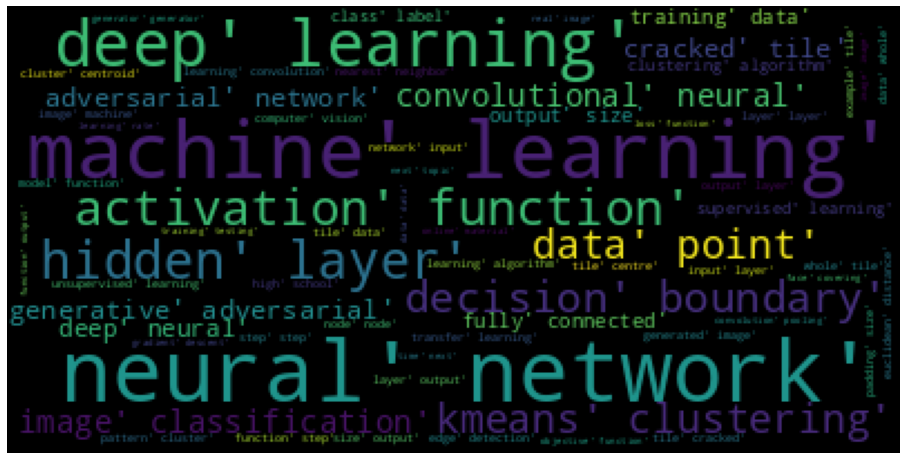

In [72]:
#@title
# DL word cloud

tplot = ''
for cat in dlLemm:
  cat = str(cat)
  tokens = cat.split()
  for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()
    tplot += " ".join(tokens)

word_cloud = WordCloud(collocations = False, 
                       width=1920, height = 1080,
                       background_color = 'white').generate(tplot)

# cloud = WordCloud(width=200/my_dpi,height=150/my_dpi)
# plt.imshow(cloud.generate_from_frequencies(t))
# plt.savefig('c.png', dpi=my_dpi)
# plt.clf()

plt.figure(figsize=(16, 16), facecolor = None)
plt.imshow(WordCloud().generate(tplot))
plt.axis('off')
# plt.show()

# plt.savefig("/Images/DLWC.png", format="png", dpi=1200)

word_cloud.to_file("/Images/DLWC.png")

/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/usr

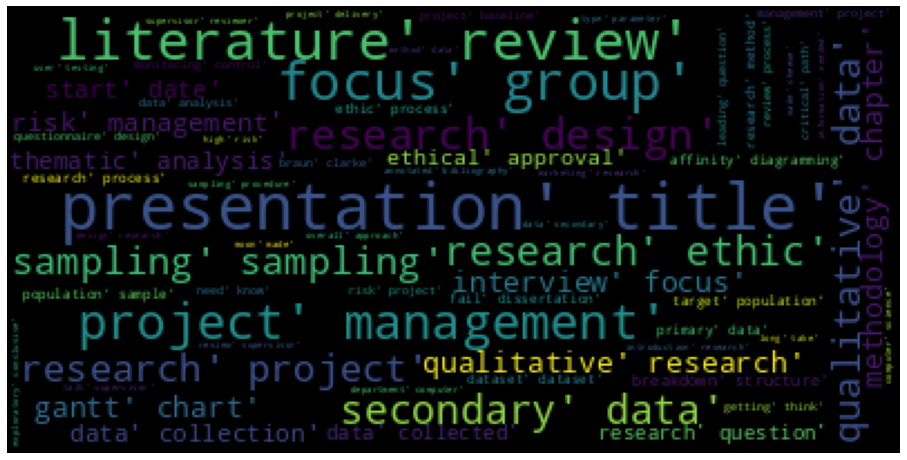

In [73]:
#@title
# RPM word cloud

tplot = ''
for cat in rpmLemm:
  cat = str(cat)
  tokens = cat.split()
  for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()
    tplot += " ".join(tokens)

word_cloud = WordCloud(collocations = False, 
                       width=1920, height = 1080,
                       background_color = 'white').generate(tplot)



plt.figure(figsize=(16, 16), facecolor = None)
plt.imshow(WordCloud().generate(tplot))
plt.axis('off')
# plt.show()


# plt.savefig("/Images/RPMWC.png", format="png", dpi=1200)
word_cloud.to_file("/Images/RPMWC.png")

In [74]:
#@title


Word Freq Histograms

In [75]:
#@title
def WordFreq(lemmWords, numOfWordsToDisplay):
  # List of all words across tweets
  all_words = list(itertools.chain(*lemmWords))

  # Create counter
  counts_words = collect.Counter(all_words)

  counts_words.most_common(numOfWordsToDisplay)


  counts_words_df = pd.DataFrame(counts_words.most_common(numOfWordsToDisplay),
                             columns=['words', 'count'])

  return counts_words_df

In [76]:
#@title
AI_Freq = WordFreq(aiLemm, 30)
ML_Freq = WordFreq(mlLemm, 30)
QDA_Freq = WordFreq(qdaLemm, 30)
RPM_Freq = WordFreq(rpmLemm, 30)
MD_Freq = WordFreq(mdLemm, 30)
DL_Freq = WordFreq(dlLemm, 30)

AI


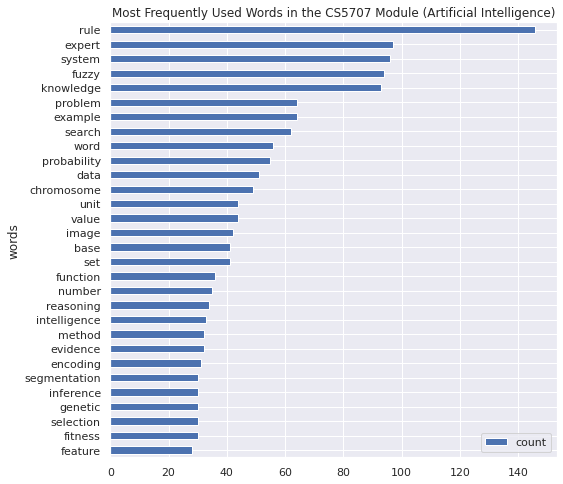

In [77]:
#@title
fig, ax = plt.subplots(figsize=(8, 8))

# Plot horizontal bar graph
AI_Freq.sort_values(by='count').plot.barh(x='words',
                      y='count',
                      ax=ax)

ax.set_title("Most Frequently Used Words in the CS5707 Module (Artificial Intelligence)")

# plt.show()
plt.savefig("/Images/AIWordFreq.png", format="png", dpi=1200)

QDA

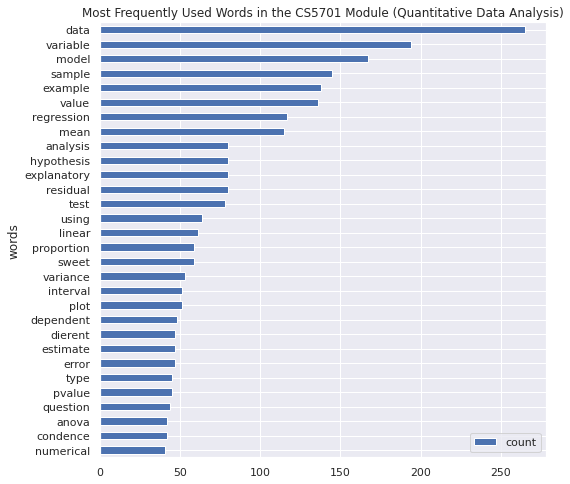

In [78]:
#@title
fig, ax = plt.subplots(figsize=(8, 8))

# Plot horizontal bar graph
QDA_Freq.sort_values(by='count').plot.barh(x='words',
                      y='count',
                      ax=ax)

ax.set_title("Most Frequently Used Words in the CS5701 Module (Quantitative Data Analysis)")

# plt.show()
plt.savefig("/Images/QDAWordFreq.png", format="png", dpi=1200)

RPM

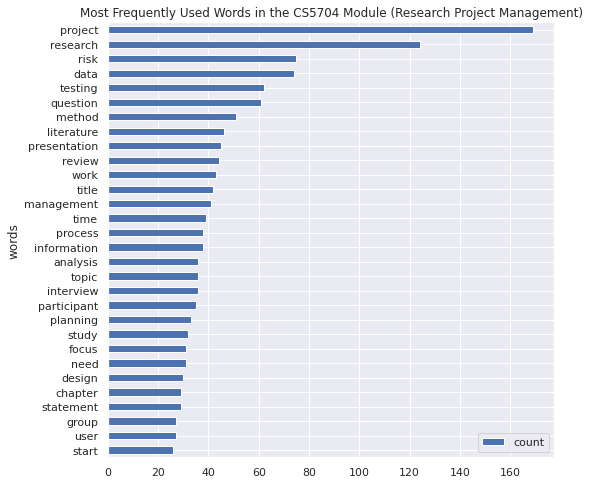

In [79]:
#@title
fig, ax = plt.subplots(figsize=(8, 8))

# Plot horizontal bar graph
RPM_Freq.sort_values(by='count').plot.barh(x='words',
                      y='count',
                      ax=ax)

ax.set_title("Most Frequently Used Words in the CS5704 Module (Research Project Management)")

# plt.show()
plt.savefig("/Images/RPMWordFreq.png", format="png", dpi=1200)

DL

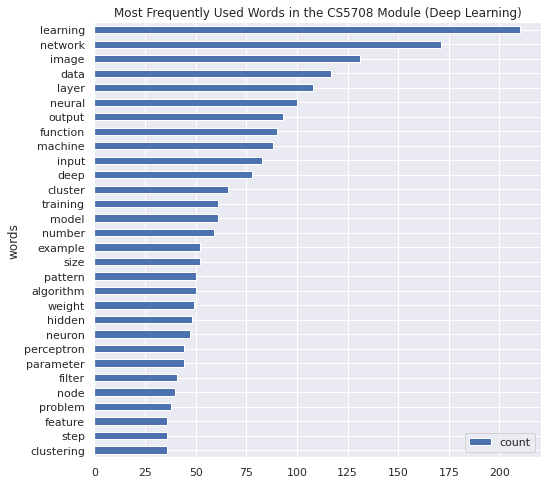

In [80]:
#@title
fig, ax = plt.subplots(figsize=(8, 8))

# Plot horizontal bar graph
DL_Freq.sort_values(by='count').plot.barh(x='words',
                      y='count',
                      ax=ax)

ax.set_title("Most Frequently Used Words in the CS5708 Module (Deep Learning)")

# plt.show()
plt.savefig("/Images/DLWordFreq.png", format="png", dpi=1200)

ML

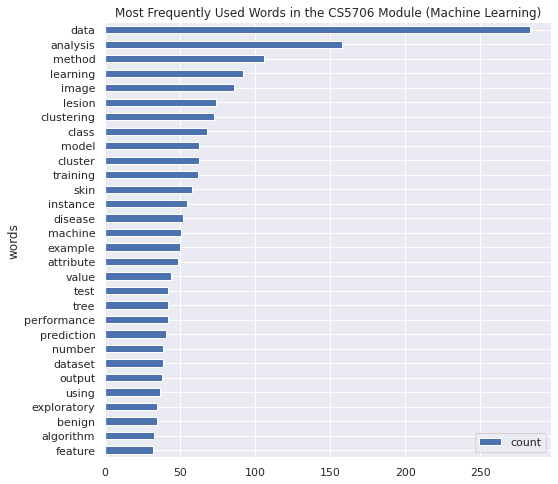

In [81]:
#@title
fig, ax = plt.subplots(figsize=(8, 8))

# Plot horizontal bar graph
ML_Freq.sort_values(by='count').plot.barh(x='words',
                      y='count',
                      ax=ax)

ax.set_title("Most Frequently Used Words in the CS5706 Module (Machine Learning)")

# plt.show()
plt.savefig("/Images/MLWordFreq.png", format="png", dpi=1200)

MD

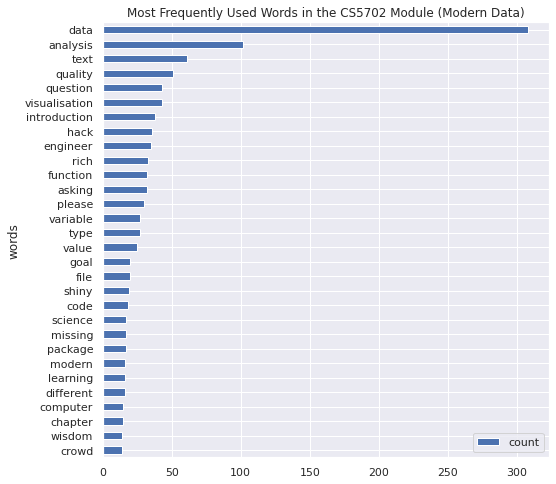

In [82]:
#@title
fig, ax = plt.subplots(figsize=(8, 8))

# Plot horizontal bar graph
MD_Freq.sort_values(by='count').plot.barh(x='words',
                      y='count',
                      ax=ax)

ax.set_title("Most Frequently Used Words in the CS5702 Module (Modern Data)")

# plt.show()
plt.savefig("/Images/MDWordFreq.png", format="png", dpi=1200)

Combined Modules


In [83]:
#@title
# All cleaned data for all modules combined into one list

dataLemm = aiLemm + rpmLemm + mdLemm + qdaLemm + mlLemm + dlLemm

/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/usr/local/lib/python3.7/dist-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/usr

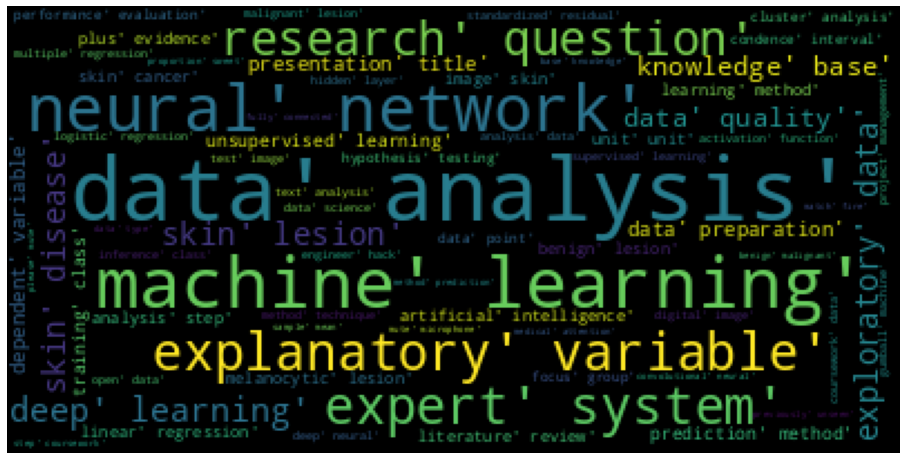

In [190]:
# # @title
# # Combined Dataset word cloud
# # Uses a lot of working memory. Needs to be ran on > 13GB of memory. 

# tplot = ''
# for cat in dataLemm:
#   cat = str(cat)
#   tokens = cat.split()
#   for i in range(len(tokens)):
#     tokens[i] = tokens[i].lower()
#     tplot += " ".join(tokens)

# word_cloud = WordCloud(collocations = False, 
#                        width=1920, height = 1080,
#                        background_color = 'white').generate(tplot)



# plt.figure(figsize=(16, 16), facecolor = None)
# plt.imshow(WordCloud().generate(tplot))
# plt.axis('off')
# # plt.show()



# word_cloud.to_file("/Images/CombinedWC.png")

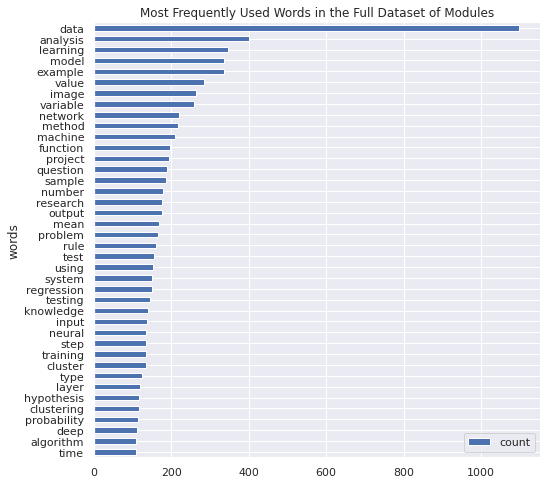

In [85]:
#@title
Full_dataset_freq = WordFreq(dataLemm, 40)

fig, ax = plt.subplots(figsize=(8, 8))

# Plot horizontal bar graph
Full_dataset_freq.sort_values(by='count').plot.barh(x='words',
                      y='count',
                      ax=ax)

ax.set_title("Most Frequently Used Words in the Full Dataset of Modules")

# plt.show()
plt.savefig("/Images/FullWordFreq.png", format="png", dpi=1200)

In [86]:
#@title
def network_words(lemmWords, numOfWordsToDisplay):
  # List of all words across tweets

  terms_bigram = [list(bigrams(tok)) for tok in lemmWords]
  word_bigrams = list(itertools.chain(*terms_bigram))

  # Create counter of words in clean bigrams
  bigram_counts = collect.Counter(word_bigrams)

  bigram_counts.most_common(numOfWordsToDisplay)

  bigram_df = pd.DataFrame(bigram_counts.most_common(numOfWordsToDisplay),
                             columns=['bigram', 'count'])


  return bigram_df

In [87]:
#@title
def network_trigram(lemmWords, numOfWordsToDisplay):
  # List of all words across tweets

  terms_trigram = [list(trigrams(tok)) for tok in lemmWords]
  word_trigrams = list(itertools.chain(*terms_trigram))

  trigram_counts = collect.Counter(word_trigrams)

  trigram_counts.most_common(numOfWordsToDisplay)

  trigram_df = pd.DataFrame(trigram_counts.most_common(numOfWordsToDisplay),
                              columns=['bigram', 'count'])



  return trigram_df

AI

In [88]:
#@title
AINet = network_words(aiLemm, 20)
QDANet = network_words(qdaLemm, 20)
RPMNet = network_words(rpmLemm, 20)
MDNet = network_words(mdLemm, 20)
MLNet = network_words(mlLemm, 20)
DLNet = network_words(dlLemm, 20)

In [89]:
#@title
AITriNet = network_trigram(aiLemm, 20)
QDATriNet = network_trigram(qdaLemm, 20)
RPMTriNet = network_trigram(rpmLemm, 20)
MDTriNet = network_trigram(mdLemm, 20)
MLTriNet = network_trigram(mlLemm, 20)
DLTriNet = network_trigram(dlLemm, 20)

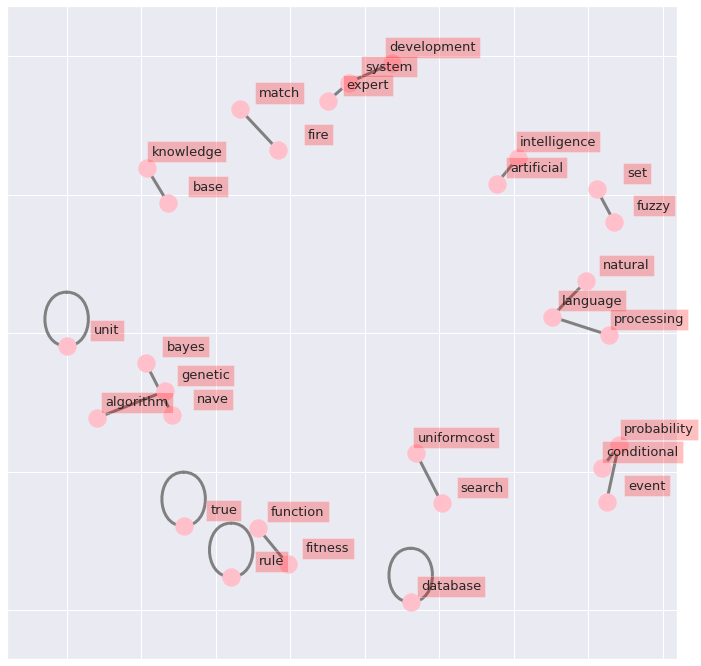

In [90]:
#@title
d = AINet.set_index('bigram').T.to_dict('records')
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

fig, ax = plt.subplots(figsize=(12, 12))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='pink',
                 with_labels = False,
                 ax=ax)

# Create offset labels
for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
# plt.show()
plt.savefig("/Images/AIWordNet.png", format="png", dpi=1200)

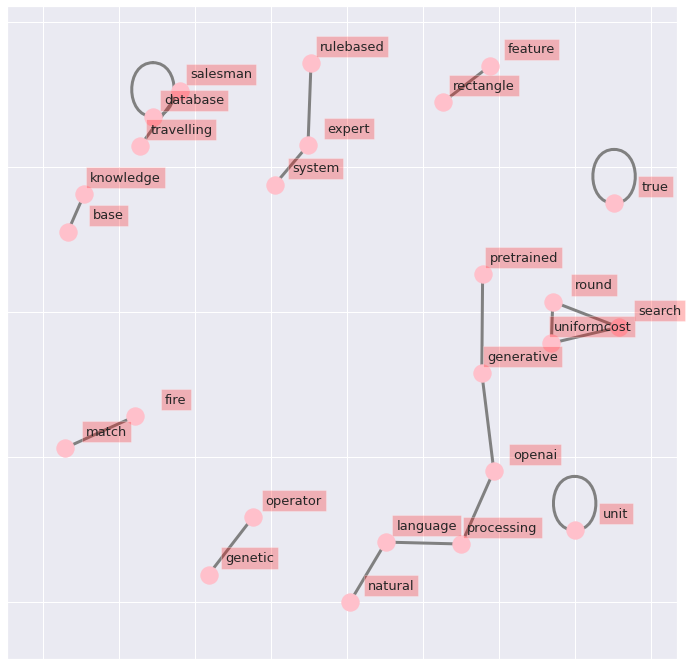

In [91]:
#@title
d = AITriNet.set_index('bigram').T.to_dict('records')
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

fig, ax = plt.subplots(figsize=(12, 12))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='pink',
                 with_labels = False,
                 ax=ax)

# Create offset labels
for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
# plt.show()
plt.savefig("/Images/AITriNet.png", format="png", dpi=1200)

QDA

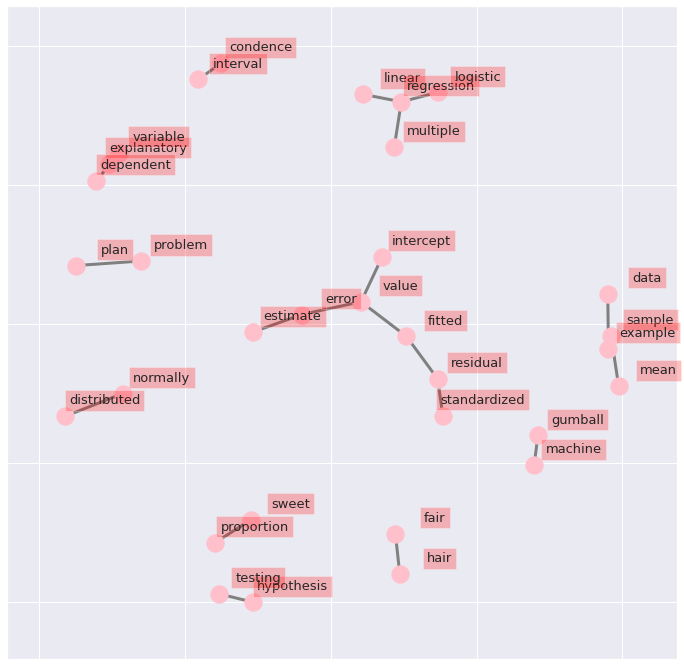

In [92]:
#@title
d = QDANet.set_index('bigram').T.to_dict('records')
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

fig, ax = plt.subplots(figsize=(12, 12))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='pink',
                 with_labels = False,
                 ax=ax)

# Create offset labels
for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
# plt.show()
plt.savefig("/Images/QDAWordNet.png", format="png", dpi=1200)

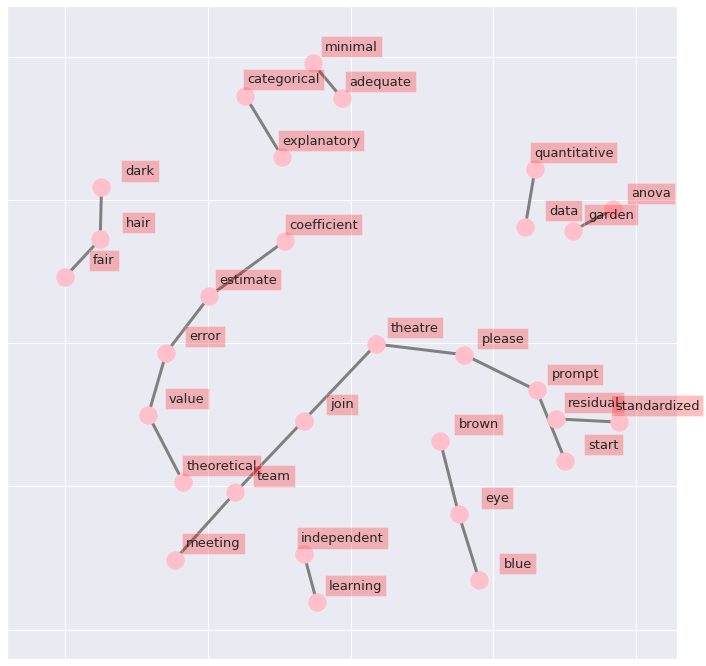

In [93]:
#@title
d = QDATriNet.set_index('bigram').T.to_dict('records')
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

fig, ax = plt.subplots(figsize=(12, 12))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='pink',
                 with_labels = False,
                 ax=ax)

# Create offset labels
for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
# plt.show()
plt.savefig("/Images/QDATriNet.png", format="png", dpi=1200)

RPM

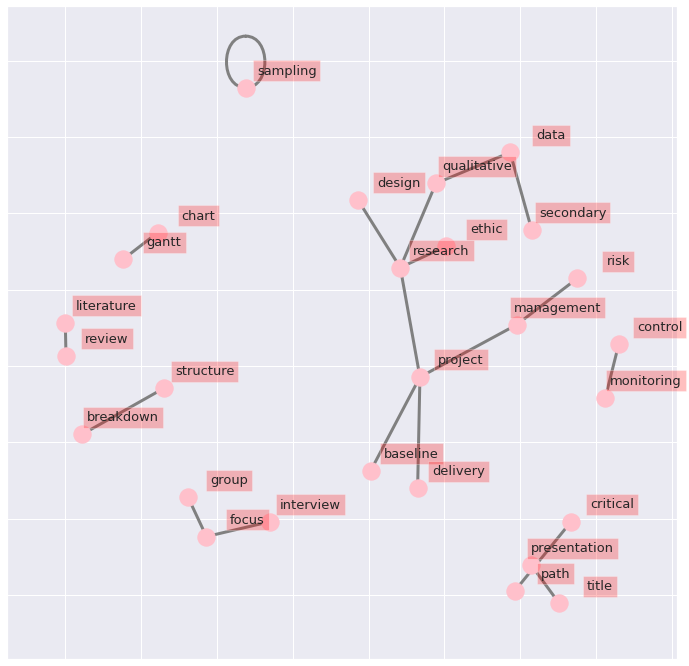

In [94]:
#@title
d = RPMNet.set_index('bigram').T.to_dict('records')
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

fig, ax = plt.subplots(figsize=(12, 12))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='pink',
                 with_labels = False,
                 ax=ax)

# Create offset labels
for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
# plt.show()
plt.savefig("/Images/RPMWordNet.png", format="png", dpi=1200)

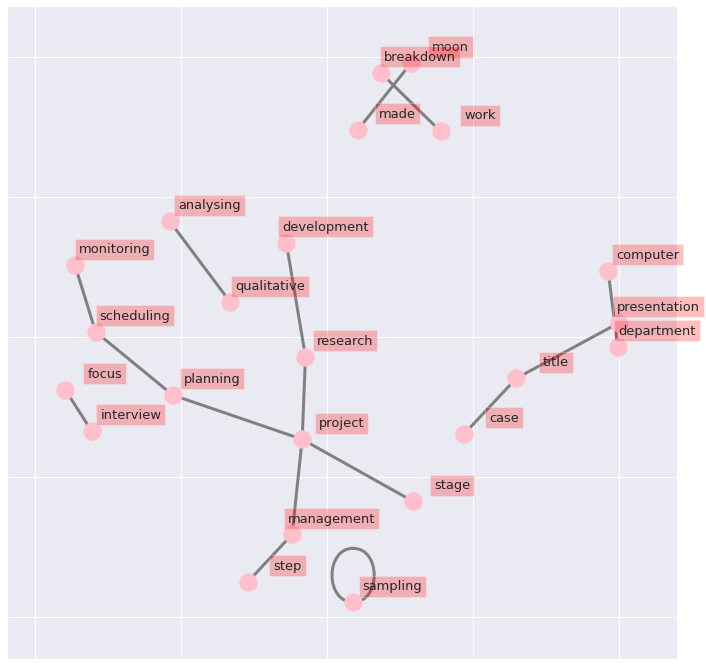

In [95]:
#@title
d = RPMTriNet.set_index('bigram').T.to_dict('records')
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

fig, ax = plt.subplots(figsize=(12, 12))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='pink',
                 with_labels = False,
                 ax=ax)

# Create offset labels
for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
# plt.show()
plt.savefig("/Images/RPMTriNet.png", format="png", dpi=1200)

MD

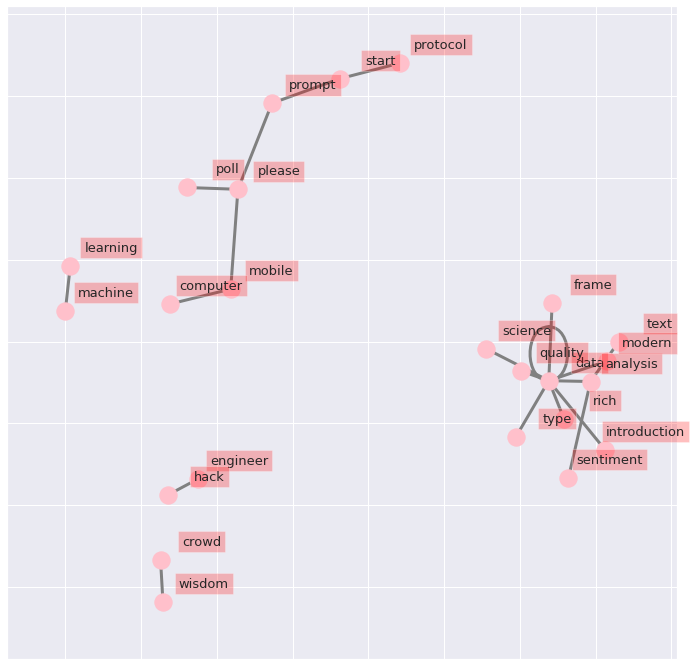

In [96]:
#@title
d = MDNet.set_index('bigram').T.to_dict('records')
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

fig, ax = plt.subplots(figsize=(12, 12))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='pink',
                 with_labels = False,
                 ax=ax)

# Create offset labels
for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
# plt.show()
plt.savefig("/Images/MDWordNet.png", format="png", dpi=1200)

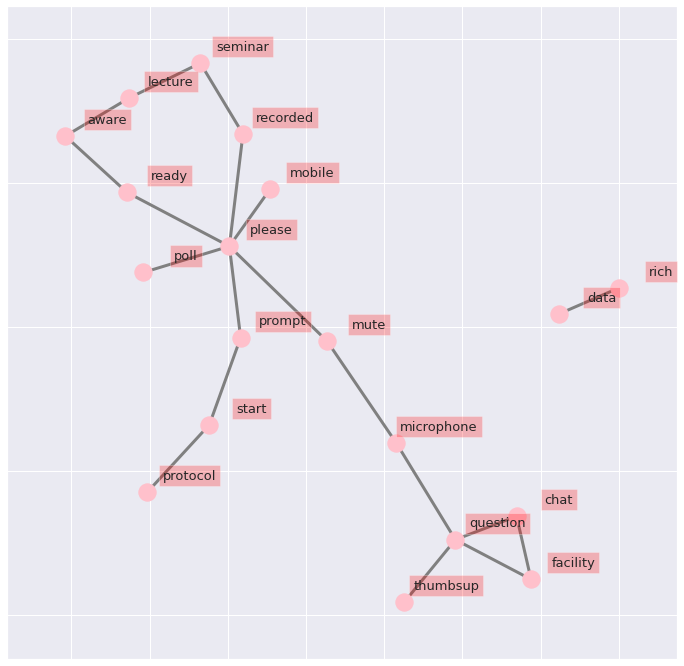

In [97]:
#@title
d = MDTriNet.set_index('bigram').T.to_dict('records')
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

fig, ax = plt.subplots(figsize=(12, 12))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='pink',
                 with_labels = False,
                 ax=ax)

# Create offset labels
for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
# plt.show()
plt.savefig("/Images/MDTriNet.png", format="png", dpi=1200)

ML

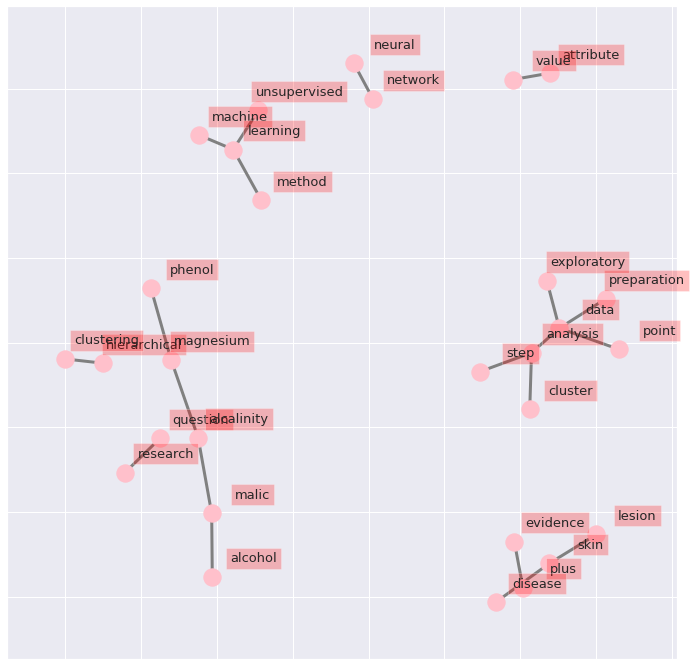

In [98]:
#@title
d = MLNet.set_index('bigram').T.to_dict('records')
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

fig, ax = plt.subplots(figsize=(12, 12))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='pink',
                 with_labels = False,
                 ax=ax)

# Create offset labels
for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
# plt.show()
plt.savefig("/Images/MLWordNet.png", format="png", dpi=1200)

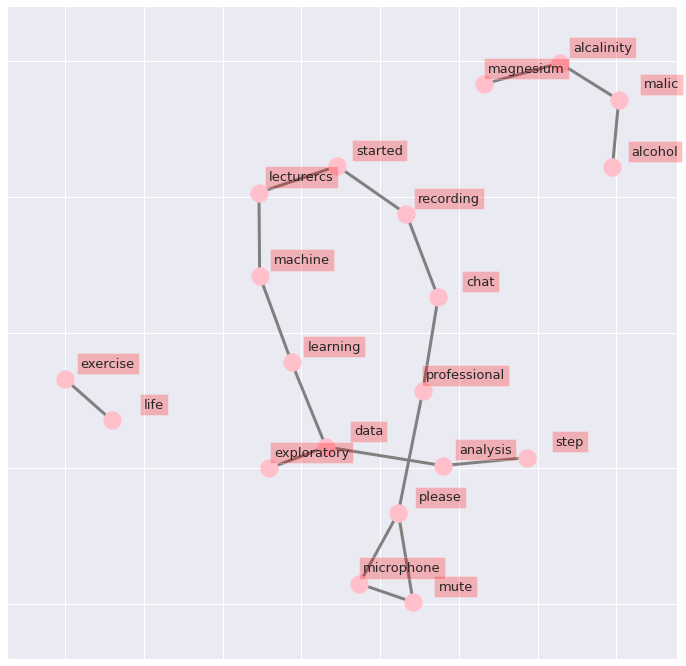

In [99]:
#@title
d = MLTriNet.set_index('bigram').T.to_dict('records')
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

fig, ax = plt.subplots(figsize=(12, 12))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='pink',
                 with_labels = False,
                 ax=ax)

# Create offset labels
for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
# plt.show()
plt.savefig("/Images/MLTriNet.png", format="png", dpi=1200)

DL

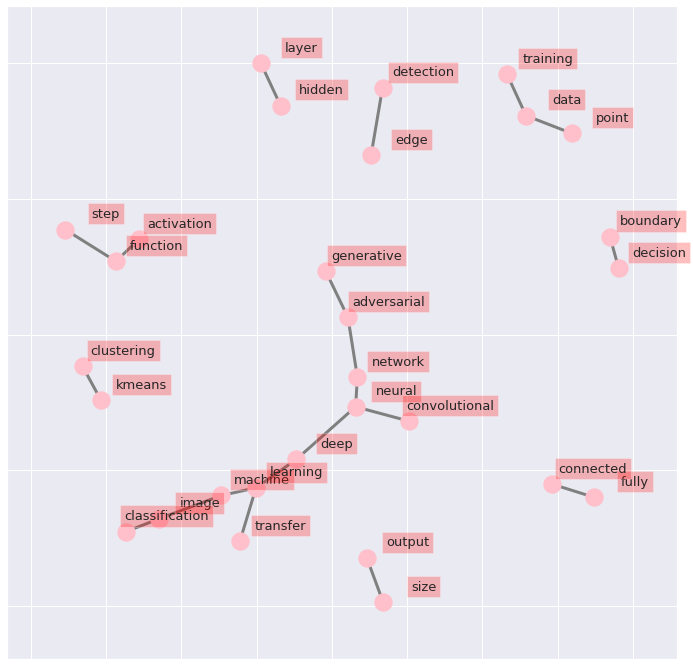

In [100]:
#@title
d = DLNet.set_index('bigram').T.to_dict('records')
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

fig, ax = plt.subplots(figsize=(12, 12))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='pink',
                 with_labels = False,
                 ax=ax)

# Create offset labels
for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
# plt.show()
plt.savefig("/Images/DLWordNet.png", format="png", dpi=1200)

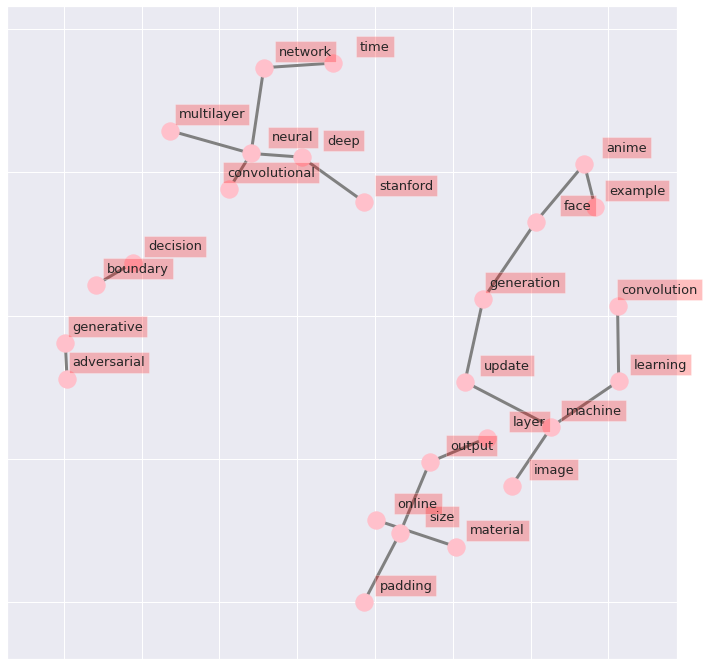

In [101]:
#@title
d = DLTriNet.set_index('bigram').T.to_dict('records')
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

fig, ax = plt.subplots(figsize=(12, 12))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='pink',
                 with_labels = False,
                 ax=ax)

# Create offset labels
for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
# plt.show()
plt.savefig("/Images/DLTriNet.png", format="png", dpi=1200)

FULL Word Net

In [102]:
#@title
FullDataNet = network_words(dataLemm, 30)
FullDataTriNet = network_trigram(dataLemm, 30)

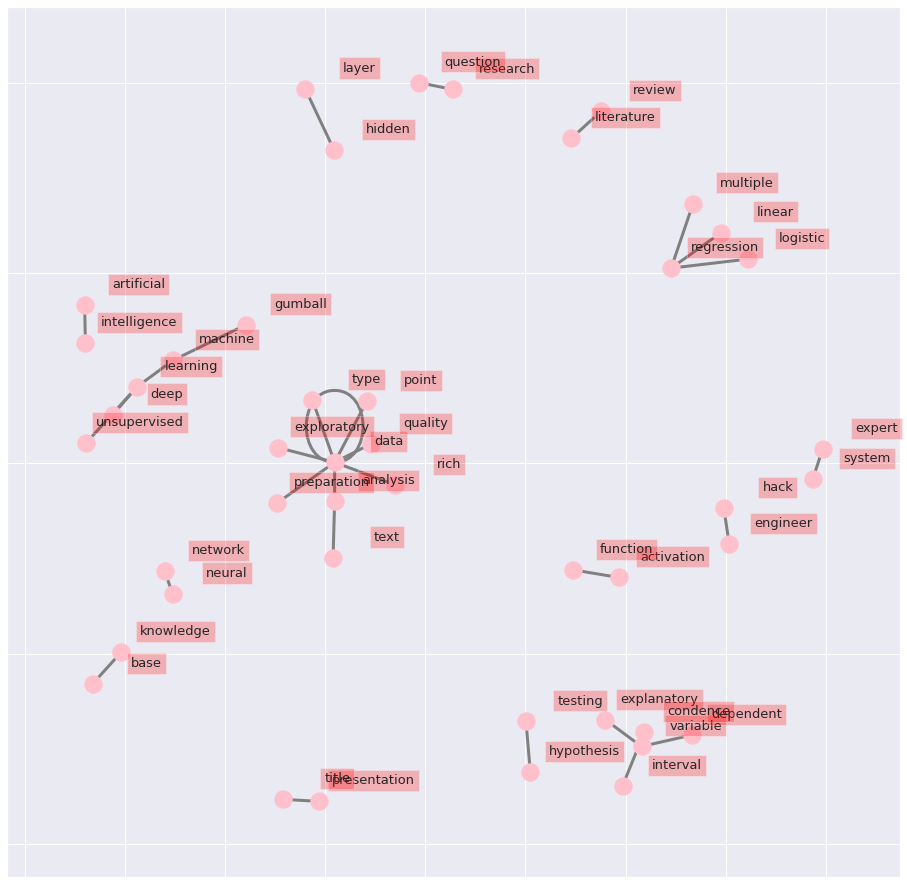

In [103]:
#@title
d = FullDataNet.set_index('bigram').T.to_dict('records')
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

fig, ax = plt.subplots(figsize=(16, 16))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='pink',
                 with_labels = False,
                 ax=ax)

# Create offset labels
for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
# plt.show()
plt.savefig("/Images/FullWordNet.png", format="png", dpi=1200)

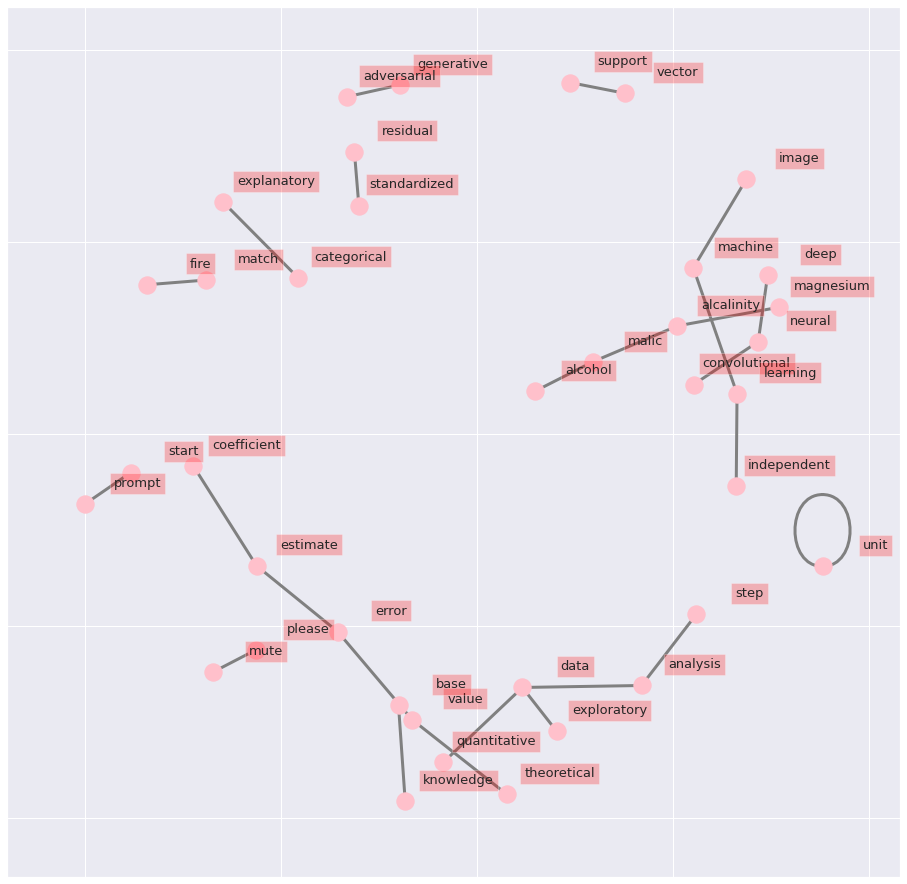

In [104]:
#@title
d = FullDataTriNet.set_index('bigram').T.to_dict('records')
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

fig, ax = plt.subplots(figsize=(16, 16))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='pink',
                 with_labels = False,
                 ax=ax)

# Create offset labels
for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
# plt.show()
plt.savefig("/Images/FullTriNet.png", format="png", dpi=1200)

In [105]:
# stop



----
----



# Some Extraction Algorithms

LDA

Using LDA Multicore

In [106]:
# Function to plot LDA graph
def lda_plot(model, bow, dictionary):

  lda_display = pyLDAvis.gensim_models.prepare(model, bow, dictionary, mds='mmds')
  return pyLDAvis.display(lda_display)




In [107]:
# Latent dirichlet allocation fucntion

def lda_multi(bow, module_file_order, dictionary):

  lda_model =  gensim.models.LdaMulticore(bow, 
                                   num_topics = len(module_file_order), 
                                   id2word = dictionary, 
                                   iterations = 100,                                   
                                   passes = 100,
                                   workers = 2)
  print(module_file_order)
  print("\n")

  for idx, topic in lda_model.print_topics(-1):
    print("Topic: {} \nWords: {}".format(idx, topic ))
    print("\n")

  return lda_model

AI

In [108]:
ai_lda = lda_multi(ai_bow,ai_file_order,ai_dict)

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

['AI7.pdf', 'AI4.pdf', 'AI5.pdf', 'AI6.pdf', 'AI2.pdf', 'AI3.pdf', 'AI1.pdf', 'AI8.pdf', 'AI9.pdf']


Topic: 0 
Words: 0.038*"word" + 0.014*"language" + 0.012*"model" + 0.011*"vector" + 0.011*"analysis" + 0.011*"text" + 0.010*"processing" + 0.009*"document" + 0.008*"classification" + 0.008*"recognition"


Topic: 1 
Words: 0.000*"word" + 0.000*"language" + 0.000*"model" + 0.000*"text" + 0.000*"processing" + 0.000*"document" + 0.000*"data" + 0.000*"vector" + 0.000*"recognition" + 0.000*"modelling"


Topic: 2 
Words: 0.029*"chromosome" + 0.018*"selection" + 0.016*"example" + 0.016*"fitness" + 0.015*"encoding" + 0.015*"unit" + 0.014*"genetic" + 0.014*"crossover" + 0.012*"mutation" + 0.011*"evolution"


Topic: 3 
Words: 0.000*"problem" + 0.000*"inappropriate" + 0.000*"incorrect" + 0.000*"heavily" + 0.000*"heterogeneous" + 0.000*"hypotenuse" + 0.000*"imitate" + 0.000*"growing" + 0.000*"including" + 0.000*"inheritance"


Topic: 4 
Words: 0.090*"search" + 0.024*"uniformcost" + 0.020*"cost" + 0

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

In [109]:
lda_plot(ai_lda, ai_bow, ai_dict)

DL

In [110]:
dl_lda = lda_multi(dl_bow,dl_file_order,dl_dict)

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

['DL3.pdf', 'DL4.pdf', 'DL6.pdf', 'DL5.pdf', 'DL2.pdf', 'DL1.pdf', 'DL8.pdf', 'DL9.pdf', 'DL7.pdf']


Topic: 0 
Words: 0.038*"learning" + 0.033*"image" + 0.025*"network" + 0.022*"machine" + 0.021*"size" + 0.018*"filter" + 0.015*"convolution" + 0.015*"pooling" + 0.014*"layer" + 0.013*"parameter"


Topic: 1 
Words: 0.031*"image" + 0.027*"data" + 0.019*"learning" + 0.017*"model" + 0.017*"generator" + 0.016*"training" + 0.016*"discriminator" + 0.014*"real" + 0.012*"network" + 0.011*"distribution"


Topic: 2 
Words: 0.031*"network" + 0.028*"layer" + 0.024*"output" + 0.024*"neural" + 0.023*"function" + 0.022*"input" + 0.018*"learning" + 0.017*"perceptron" + 0.015*"neuron" + 0.015*"node"


Topic: 3 
Words: 0.041*"cluster" + 0.026*"data" + 0.023*"clustering" + 0.020*"learning" + 0.017*"tile" + 0.012*"point" + 0.012*"pattern" + 0.011*"example" + 0.011*"algorithm" + 0.011*"distance"


Topic: 4 
Words: 0.001*"learning" + 0.001*"image" + 0.001*"presence" + 0.001*"press" + 0.001*"pressure" + 0.001*

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

In [111]:
lda_plot(dl_lda, dl_bow, dl_dict)

QDA

In [112]:
qda_lda = lda_multi(qda_bow,qda_file_order,qda_dict)

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

['QDA1.pdf', 'QDA7.pdf', 'QDA6.pdf', 'QDA2.pdf', 'QDA3.pdf', 'QDA5.pdf', 'QDA4.pdf', 'QDA8.pdf', 'QDA9.pdf']


Topic: 0 
Words: 0.037*"variable" + 0.029*"regression" + 0.026*"logistic" + 0.021*"shot" + 0.019*"explanatory" + 0.017*"odds" + 0.017*"model" + 0.016*"data" + 0.013*"value" + 0.012*"response"


Topic: 1 
Words: 0.034*"sample" + 0.031*"data" + 0.029*"sweet" + 0.024*"proportion" + 0.023*"interval" + 0.022*"condence" + 0.016*"mean" + 0.015*"gumball" + 0.015*"machine" + 0.013*"example"


Topic: 2 
Words: 0.037*"variable" + 0.032*"anova" + 0.024*"garden" + 0.022*"explanatory" + 0.020*"residual" + 0.019*"example" + 0.018*"mean" + 0.017*"data" + 0.016*"grade" + 0.015*"level"


Topic: 3 
Words: 0.048*"hypothesis" + 0.043*"sample" + 0.038*"mean" + 0.036*"test" + 0.024*"testing" + 0.019*"pvalue" + 0.018*"variance" + 0.015*"value" + 0.015*"example" + 0.013*"data"


Topic: 4 
Words: 0.034*"data" + 0.034*"regression" + 0.026*"value" + 0.023*"linear" + 0.023*"model" + 0.023*"correlation" + 

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

In [113]:
lda_plot(qda_lda, qda_bow, qda_dict)

MD

In [114]:
md_lda = lda_multi(md_bow,md_file_order,md_dict)

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

['MD1.pdf', 'MD5.pdf', 'MD6.pdf', 'MD7.pdf', 'MD2.pdf', 'MD3.pdf', 'MD4.pdf', 'MD8.pdf', 'MD9.pdf']


Topic: 0 
Words: 0.029*"data" + 0.027*"hack" + 0.027*"engineer" + 0.017*"function" + 0.017*"analysis" + 0.010*"code" + 0.009*"package" + 0.007*"computer" + 0.006*"metadata" + 0.006*"need"


Topic: 1 
Words: 0.070*"text" + 0.063*"analysis" + 0.016*"word" + 0.015*"sentiment" + 0.012*"language" + 0.009*"model" + 0.006*"string" + 0.006*"processing" + 0.006*"negative" + 0.006*"survey"


Topic: 2 
Words: 0.043*"data" + 0.038*"visualisation" + 0.014*"analysis" + 0.011*"question" + 0.007*"exploratory" + 0.007*"ggplot" + 0.007*"learning" + 0.006*"based" + 0.006*"variable" + 0.006*"method"


Topic: 3 
Words: 0.063*"data" + 0.049*"introduction" + 0.013*"type" + 0.012*"modern" + 0.011*"science" + 0.011*"variable" + 0.009*"vector" + 0.007*"analysis" + 0.007*"book" + 0.007*"simple"


Topic: 4 
Words: 0.125*"data" + 0.050*"rich" + 0.020*"file" + 0.019*"type" + 0.013*"frame" + 0.010*"database" + 0.009

In [115]:
lda_plot(md_lda, md_bow, md_dict)

ML

In [116]:
ml_lda = lda_multi(ml_bow,ml_file_order,ml_dict)

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

['ML6.pdf', 'ML4.pdf', 'ML5.pdf', 'ML2.pdf', 'ML3.pdf', 'ML7.pdf', 'ML1.pdf', 'ML8.pdf', 'ML9.pdf']


Topic: 0 
Words: 0.024*"margin" + 0.023*"vector" + 0.022*"neighbor" + 0.015*"machine" + 0.015*"support" + 0.015*"data" + 0.012*"function" + 0.012*"soft" + 0.011*"output" + 0.011*"model"


Topic: 1 
Words: 0.044*"data" + 0.036*"clustering" + 0.035*"cluster" + 0.032*"method" + 0.029*"hierarchical" + 0.028*"distance" + 0.022*"object" + 0.018*"analysis" + 0.016*"euclidian" + 0.015*"dissimilarity"


Topic: 2 
Words: 0.031*"clustering" + 0.026*"tree" + 0.026*"cluster" + 0.021*"number" + 0.015*"high" + 0.013*"random" + 0.012*"point" + 0.011*"celebrity" + 0.011*"medium" + 0.011*"budget"


Topic: 3 
Words: 0.036*"analysis" + 0.032*"data" + 0.013*"component" + 0.013*"attribute" + 0.013*"selection" + 0.011*"plot" + 0.011*"variance" + 0.011*"loading" + 0.010*"score" + 0.010*"feature"


Topic: 4 
Words: 0.001*"data" + 0.001*"test" + 0.001*"using" + 0.001*"computer" + 0.001*"example" + 0.001*"class"

In [117]:
lda_plot(ml_lda, ml_bow, ml_dict)

RPM

In [118]:
rpm_lda = lda_multi(rpm_bow,rpm_file_order,rpm_dict)

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

['RPM3.pdf', 'RPM2.pdf', 'RPM7.pdf', 'RPM6.pdf', 'RPM5.pdf', 'RPM4.pdf', 'RPM1.pdf']


Topic: 0 
Words: 0.030*"research" + 0.018*"data" + 0.015*"method" + 0.011*"participant" + 0.011*"application" + 0.010*"ethic" + 0.010*"sampling" + 0.009*"supervisor" + 0.008*"project" + 0.008*"design"


Topic: 1 
Words: 0.000*"system" + 0.000*"analysis" + 0.000*"question" + 0.000*"testing" + 0.000*"risk" + 0.000*"project" + 0.000*"research" + 0.000*"coverage" + 0.000*"term" + 0.000*"thing"


Topic: 2 
Words: 0.022*"review" + 0.021*"literature" + 0.016*"research" + 0.009*"field" + 0.007*"major" + 0.007*"topic" + 0.007*"source" + 0.007*"think" + 0.007*"critical" + 0.007*"information"


Topic: 3 
Words: 0.026*"question" + 0.018*"interview" + 0.014*"group" + 0.013*"data" + 0.010*"focus" + 0.010*"questionnaire" + 0.010*"research" + 0.009*"analysis" + 0.007*"people" + 0.007*"topic"


Topic: 4 
Words: 0.057*"testing" + 0.025*"statement" + 0.018*"system" + 0.015*"coverage" + 0.013*"software" + 0.013*"user" +

In [119]:
lda_plot(rpm_lda, rpm_bow, rpm_dict)

In [120]:
# Set up coherence model
# c_uci 
# u_mass
# c_v
score = []
coherence_model_lda = CoherenceModel(model=qda_lda, texts = qdaLemm, corpus = qda_bow,  coherence='u_mass')


# CoherenceModel(model=lda_model, corpus=qda_bow, dictionary=qda_dict, coherence='u_mass')
# Calculate and print coherence

# for i in range (len(rpm_file_order)):

with np.errstate(invalid='ignore'):
    
  coherence_lda = coherence_model_lda.get_coherence()

# score.append(coherence_lda.get_coherence())

print('\nCoherence Score:', coherence_lda)


Coherence Score: -0.6413277515850778


TextRank


In [121]:
print(ai_file_order,"\n\n",
qda_file_order,"\n\n",
md_file_order,"\n\n",
ml_file_order,"\n\n",
dl_file_order,"\n\n",
rpm_file_order)

['AI7.pdf', 'AI4.pdf', 'AI5.pdf', 'AI6.pdf', 'AI2.pdf', 'AI3.pdf', 'AI1.pdf', 'AI8.pdf', 'AI9.pdf'] 

 ['QDA1.pdf', 'QDA7.pdf', 'QDA6.pdf', 'QDA2.pdf', 'QDA3.pdf', 'QDA5.pdf', 'QDA4.pdf', 'QDA8.pdf', 'QDA9.pdf'] 

 ['MD1.pdf', 'MD5.pdf', 'MD6.pdf', 'MD7.pdf', 'MD2.pdf', 'MD3.pdf', 'MD4.pdf', 'MD8.pdf', 'MD9.pdf'] 

 ['ML6.pdf', 'ML4.pdf', 'ML5.pdf', 'ML2.pdf', 'ML3.pdf', 'ML7.pdf', 'ML1.pdf', 'ML8.pdf', 'ML9.pdf'] 

 ['DL3.pdf', 'DL4.pdf', 'DL6.pdf', 'DL5.pdf', 'DL2.pdf', 'DL1.pdf', 'DL8.pdf', 'DL9.pdf', 'DL7.pdf'] 

 ['RPM3.pdf', 'RPM2.pdf', 'RPM7.pdf', 'RPM6.pdf', 'RPM5.pdf', 'RPM4.pdf', 'RPM1.pdf']


In [122]:
def TextRank(lemmatizedWords):
  newLemm = lemmatizedWords
  for i in range(len(lemmatizedWords)):
    newLemm[i] = ' '.join(lemmatizedWords[i])


    return(keywords.keywords(newLemm[i]))

In [123]:
def unwind(lemmatizedWords):
  newLemm = lemmatizedWords
  for i in range(len(lemmatizedWords)):
    newLemm[i] = ' '.join(lemmatizedWords[i])

  return newLemm

RPM

In [124]:
rpm_tr = TextRank(rpmLemm)


In [125]:
print(rpm_tr)

research project management
delivery risk
manager
planned
impact
changed
changing
change
approved plan
manage progress ensure
analysis
timing
planning focus work
scheduling
important task
baseline
schedule cost
monitor
monitoring focusing
identified
look
looking
control
controlled
method
following
follows
quick
probability
probable
time gantt chart
activity
stage
milestone
occurring
occur
occurs
resource
proposed identify
quickly accepting
response
responsibility
responsible
quantitative
start
high
highly
technique
date
importantly
delayed
delay
ensuring
calculate
calculated
make
accepted
accept
making action
development
develop
agile
proposal
stakeholder approval
presentation
qualitative
area
tip
team
track
effect
issue
applies
applying
case
approach
complex
contingency adding
board
software
ricky
title
achieving
achieve
discussion


AI

In [126]:
ai_tr = TextRank(aiLemm)

In [127]:
print(ai_tr)

vector
word representation model sentiment analysis text classification topic modelling
languag
recognition
problem
method
document
evaluate
evaluation
natural language processing
size
good
space
transform
machine translation
process processed
frequency
task
software
collection
data training testing
transformer bert
context
example
performance
trend
embedding
embeddings
dangerous
danger
movie review positive negative
onehot encoding
trained
natur
defence
application
simple
google
study
deep learning
stemming
fast
label
labelled
power
unlabelled
relationship
impact unified
question
vman vwoman
maximise
latent
tagging
neural
number
structure
fake
nave
applied
apply


ML

In [128]:
ml_tr = TextRank(mlLemm)

In [129]:
print(ml_tr)

learning data
neural network
training
train
neuron
regression
parameter
input output model
function
linear
error predicting
quality
life
vector
started
starting
predictive
mean
organizing
genetics
compute predicted
connected
activation
bias
backpropagation
close
computationally
pred
given
phase


MD

In [130]:
md_tr = TextRank(mdLemm)

In [131]:
print(md_tr)

modern data introduction
variable
type
module
vector multiple
science
simple
function
analysis
salary
study
learning
learn
extension question
true
rstudio
basic getting help
dataframe
chapter
graphical
graphic
file
seminar
approach resource
open
integration
completed
checklist
course structure
different
interactive book
appreciation
team professor
powerful
researcher integrates
read provost
case
understanding
reading list research
understand main
opportunity
blackboard
mainly
wickham
view
frame
source
length
grolemund


QDA

In [132]:
qda_tr = TextRank(qdaLemm)

In [133]:
print(qda_tr)

data analysis
variable
statistical
statistic
numerically
example
observation
spread variability
model
value measure
categorical
type
grassland false
frequency
method numerical
conclusion
mean
possible meaning
sample
sampling
exploration
explore
exploring
problem
category attribute observed
worm
vegetation
descriptive
description
determine dierent
needed
need estimate
damp
population
plan
true
continuous
important
year
ordering
order
ordered
look
median
plot
summarise
summarised
scrub
group
graph
process ppdac
percentile
make
necessary
question
later


DL

In [134]:
dl_tr = TextRank(dlLemm)

In [135]:
print(dl_tr)

input
perceptron
neuron
output
learn
function
weight
weighted
pattern
training
learning neural network machine
linear
connecting
connected activated
activation
feature
artificial
classification
connection called
linearly separable
logical
decision boundary
brain work
result threshold value
number
problem desired
model
class
information
bird
algorithm
object
sign
simple
colour
think parameter
example
limitation
layer
axon
soma cell
iteration
signal
hard limiter
actual
error
need
initial
bias
element
separate
image
classify
classifier


RAKE

In [136]:
!pip install python-rake

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [137]:
import RAKE
import operator

In [138]:
# RAKE stopwords directory
stop_dir = "/Data/SmartStoplist.txt"

In [139]:
rake_object = RAKE.Rake(stop_dir)

In [140]:
def Sort_Tuple(tup):

  # reverse = None (Sorts in Ascending order)
  # key is set to sort using second element of 
  # sublist lambda has been used 
  tup.sort(key = lambda x: x[1])
  return tup

In [141]:
def rake_code(unlemm):
  for i in range(len(unlemm)):
    keywords = Sort_Tuple(rake_object.run(unlemm[i]))[-10:]
    print("Doc {} keywords: ".format(i), keywords)

AI

In [142]:
aiUnlemm = unwind(aiLemm)

In [143]:
rake_code(aiUnlemm)

Doc 0 keywords:  []
Doc 1 keywords:  [('control interface software', 9.0), ('desired solution rule', 9.166666666666666), ('umbrella fire rule', 9.166666666666666), ('rule working rule', 9.333333333333332), ('rarely casebackward chaining', 9.333333333333334), ('inference engine put', 10.0), ('expert system development technique', 15.0), ('change made part system', 16.0), ('fact forward chaining inference technique', 20.333333333333336), ('knowledge base searched find rule', 20.833333333333332)]
Doc 2 keywords:  [('expert large expert system', 14.25), ('mutually exclusive exhaustive hypothesis', 15.0), ('finally observe evidence probability', 15.133333333333333), ('conditionally independent evidence creates', 15.333333333333334), ('ability handle vague association', 16.0), ('number failure failure number', 16.666666666666664), ('hypothesis prior conditional probability probability', 19.6), ('empirical data expert judgement consistentan', 22.125), ('combine knowledge expertise number expe

DL

In [144]:
dlUnlemm = unwind(dlLemm)

In [145]:
rake_code(dlUnlemm)

Doc 0 keywords:  []
Doc 1 keywords:  [('activated output attains', 8.0), ('half gradient weight', 8.766666666666666), ('case simultaneously fancy method', 16.0), ('matrixmatrix multiplies efficient minibatches', 16.333333333333332), ('gpus computationally efficient minibatches', 16.333333333333332), ('computing full gradient update weight', 20.6), ('minibatch learning updating weight minibatches', 22.833333333333332), ('wrong learning rate weight slosh', 23.5), ('ravine learning rate oscillation diverges', 24.0), ('topic deep neural network time', 25.0)]
Doc 2 keywords:  [('layer dropout node', 9.0), ('probability probability vector', 9.0), ('fully connected network', 10.0), ('image property pooling pattern', 15.0), ('face covering washing hand', 16.0), ('supplied sanitiser regularly respecting', 16.0), ('space reporting evision selfisolating', 16.0), ('represents intensity machine learning', 16.0), ('region upperleft beak detector parameter', 23.0), ('topic convolutional neural networ

QDA

In [146]:
qdaUnlemm = unwind(qdaLemm)

rake_code(qdaUnlemm)

Doc 0 keywords:  []
Doc 1 keywords:  [('intercept weight logistic regression', 14.333333333333334), ('range explanatory variable lead', 14.5), ('function binary response variable', 14.833333333333334), ('intercept trashorientationwide trashdistance trashhandgood', 15.333333333333334), ('case dependent variable binary', 15.5), ('relationship independently trashball modelling', 15.5), ('page crawley structure dened', 16.0), ('transformed interval order modelled', 16.0), ('extract logistic regression coecients', 16.0), ('good hand logistic regression', 16.0)]
Doc 2 keywords:  [('pollution model model diagnostics variance', 20.933333333333334), ('transformation exploring data output model', 21.71666666666667), ('transformation multicollinearity data quality missing', 21.916666666666668), ('variance task multiple regression estimate', 22.0), ('explanatory variable include model selection', 22.383333333333333), ('dependent variable explanatory variable step', 22.416666666666664), ('step mult

ML

In [147]:
mlUnlemm = unwind(mlLemm)

rake_code(mlUnlemm)

Doc 0 keywords:  []
Doc 1 keywords:  [('division', 1.0), ('cluster', 2.3333333333333335), ('mute microphone', 4.0), ('partition nphard', 4.0), ('arithmetic average average distance', 16.0), ('distinct cluster group object similar', 22.333333333333336)]
Doc 2 keywords:  [('clustering', 1.0), ('mute microphone', 4.0), ('object nearest cluster centre', 16.0)]
Doc 3 keywords:  [('performing embedded method learn', 16.0), ('replacement central tendency attribute', 16.0), ('undened handling missing attribute', 16.787878787878785), ('missing valuesdata cleaning missing', 16.909090909090907), ('undened data cleaning missing', 17.054545454545455), ('data analysisdata cleaning missing', 17.054545454545455), ('duplicated instance reason missing attribute', 22.454545454545453), ('data analysis handling duplicated instance', 22.933333333333334), ('eliminate data instance impute missing', 23.054545454545455), ('recorded calculated information collected attribute', 24.0)]
Doc 4 keywords:  [('mute mic

MD

In [148]:
mdUnlemm = unwind(mdLemm)

rake_code(mdUnlemm)

Doc 0 keywords:  []
Doc 1 keywords:  [('unique dataset setmembership constraint', 16.5), ('data quality ignore problemmissing', 16.833333333333332), ('implement check data quality', 16.833333333333332), ('change made data cleaning missing', 22.5), ('number date uniqueness field field', 23.666666666666664), ('step data quality cleaning process', 23.833333333333332), ('correctingaddressing mistake data organising data', 24.0), ('data type range minimum maximum', 24.5), ('code referential integrity constraint based', 24.5), ('ready aware lecture seminar recorded', 25.0)]
Doc 2 keywords:  [('question read graph chart figure', 20.38095238095238), ('thinking purpose goal scott berinato', 21.833333333333336), ('make sense work scott berinato', 22.833333333333332), ('usual virtual protocol start prompt', 25.0), ('ready aware lecture seminar recorded', 25.0), ('visual communication musthave skill manager', 25.0), ('availabiity tool reinforces impulse click', 25.0), ('narrative colour shape size

RPM

In [149]:
rpmUnlemm = unwind(rpmLemm)

rake_code(rpmUnlemm)

Doc 0 keywords:  []
Doc 1 keywords:  [('risk risk waterfall cont', 15.5), ('stable organization capability manage', 16.0), ('completely stopping delivery remember', 16.0), ('initial guidance estimation laugh', 16.0), ('detail project planning project working', 21.4), ('piece information missing long task', 22.25), ('equal work represented parent software', 23.0), ('week talk presentation title agile', 24.333333333333332), ('iteration allowing change happen agile', 24.333333333333332), ('choice tool good show progress', 25.0)]
Doc 2 keywords:  [('insight gathered parting', 9.0), ('construct coveredexecuted testing', 10.5), ('early phase software development', 13.833333333333334), ('flow control program insist', 15.0), ('test input outputabxy unreachable statement', 20.5), ('impossible inputoutput model software testing', 24.166666666666668), ('user experiment site short testing', 24.5), ('testing method single method performs', 24.5), ('believing thing easily software tester', 24.666666

YAKE

In [150]:
!pip install git+https://github.com/LIAAD/yake 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/LIAAD/yake to /tmp/pip-req-build-luht7czj
  Running command git clone -q https://github.com/LIAAD/yake /tmp/pip-req-build-luht7czj
     |████████████████████████████████| 132 kB 5.8 MB/s 
  Created wheel for yake: filename=yake-0.4.8-py2.py3-none-any.whl size=62602 sha256=ded2966ed45ebd91ae51c84d59c126795508838aef31bc2f3bbd17662ffae634
  Stored in directory: /tmp/pip-ephem-wheel-cache-a9yae329/wheels/52/79/f4/dae9309f60266aa3767a4381405002b6f2955fbcf038d804da
  Created wheel for jellyfish: filename=jellyfish-0.9.0-cp37-cp37m-linux_x86_64.whl size=74022 sha256=bf93dc10d9e2ea4d6cf9c08ee072063d9919aa71bf37d3d89a9711c0234ff36e
  Stored in directory: /root/.cache/pip/wheels/fe/99/4e/646ce766df0d070b0ef04db27aa11543e2767fda3075aec31b
Successfully built yake jellyfish


In [151]:
import yake

In [152]:
kw_extractor = yake.KeywordExtractor()


In [153]:
def yake(unlemm):
  for i in range (len(unlemm)):
    yake_keywords = kw_extractor.extract_keywords(unlemm[i])
    
    for kw in yake_keywords:
      print("Doc {} keywords: ".format(i), kw)

In [154]:
# for i in range (len(aiUnlemm)):
#     yake_keywords = kw_extractor.extract_keywords(aiUnlemm[i])
    
#     for kw in yake_keywords:
#       print(kw)

In [155]:
# from yake.highlight import TextHighlighter

# th = TextHighlighter(max_ngram_size = 3)
# th.highlight(lemmWords[5], keywords)

In [156]:
qdaLemm = lemmFunc(qdaCorpus)
mlLemm = lemmFunc(mlCorpus)
aiLemm = lemmFunc(aiCorpus)
mdLemm = lemmFunc(mdCorpus)
dlLemm = lemmFunc(dlCorpus)
rpmLemm = lemmFunc(rpmCorpus)

AI

In [157]:
aiUnlemm = unwind(aiLemm)


In [158]:
print(yake(aiUnlemm))

Doc 0 keywords:  ('language processing openai', 4.154194060302059e-05)
Doc 0 keywords:  ('sentiment analysis text', 4.370529397223547e-05)
Doc 0 keywords:  ('analysis text classification', 4.3749536894899284e-05)
Doc 0 keywords:  ('processing openai generative', 5.1677138439922124e-05)
Doc 0 keywords:  ('unified multitask model', 6.261767580107425e-05)
Doc 0 keywords:  ('natural language processing', 6.42240346892672e-05)
Doc 0 keywords:  ('openai generative pretrained', 6.601672604098426e-05)
Doc 0 keywords:  ('generative pretrained transformer', 6.91794809409438e-05)
Doc 0 keywords:  ('gptnatural language processing', 7.315667777431295e-05)
Doc 0 keywords:  ('recognition sentiment analysis', 7.565363993462871e-05)
Doc 0 keywords:  ('text classification topic', 7.573025184074759e-05)
Doc 0 keywords:  ('analysis movie review', 8.453181821792518e-05)
Doc 0 keywords:  ('classification topic modelling', 8.781297731047709e-05)
Doc 0 keywords:  ('application sentiment analysis', 8.797009960

DL

In [159]:
# lowest prob on top highest below but vals so small and so close

In [160]:
dlUnlemm = unwind(dlLemm)
print(yake(dlUnlemm))

Doc 0 keywords:  ('decision boundary perceptron', 3.4994930382369376e-05)
Doc 0 keywords:  ('artificial neural network', 6.872861612853178e-05)
Doc 0 keywords:  ('learning application image', 6.949075150675052e-05)
Doc 0 keywords:  ('application image classification', 7.617537568920401e-05)
Doc 0 keywords:  ('boundary decision boundary', 7.779893764097483e-05)
Doc 0 keywords:  ('boundary perceptron perceptron', 0.00011346122883020342)
Doc 0 keywords:  ('layer output layer', 0.00011392868333825139)
Doc 0 keywords:  ('perceptron decision boundary', 0.00012248225633829283)
Doc 0 keywords:  ('layer artificial neural', 0.00012989366865958976)
Doc 0 keywords:  ('neural network consists', 0.00014790437567886787)
Doc 0 keywords:  ('machine learning application', 0.00014993383344582295)
Doc 0 keywords:  ('input layer output', 0.0001749501221982418)
Doc 0 keywords:  ('limiter sign function', 0.0001759596630467251)
Doc 0 keywords:  ('decision decision boundary', 0.00017637604209278234)
Doc 0 keyw

QDA

In [161]:
qdaUnlemm = unwind(qdaLemm)
print(yake(qdaUnlemm))

Doc 0 keywords:  ('data descriptive statistic', 1.7370511896100708e-05)
Doc 0 keywords:  ('frequency arable grassland', 2.63087497266643e-05)
Doc 0 keywords:  ('arable grassland meadow', 3.001274697001466e-05)
Doc 0 keywords:  ('grassland meadow orchard', 3.320188979790101e-05)
Doc 0 keywords:  ('descriptive statistic frequency', 3.5347922426940175e-05)
Doc 0 keywords:  ('categorical data descriptive', 3.65370990045896e-05)
Doc 0 keywords:  ('meadow orchard scrub', 4.717600463536227e-05)
Doc 0 keywords:  ('numerical data descriptive', 5.026314460784229e-05)
Doc 0 keywords:  ('statistic frequency table', 5.115148435310671e-05)
Doc 0 keywords:  ('frequency table vegetation', 5.880520251759585e-05)
Doc 0 keywords:  ('table vegetation frequency', 5.880520251759585e-05)
Doc 0 keywords:  ('descriptive statistic type', 5.967851230453528e-05)
Doc 0 keywords:  ('descriptive statistic dierent', 6.395476420850097e-05)
Doc 0 keywords:  ('descriptive statistic measure', 6.76722474260275e-05)
Doc 0 

ML

In [162]:
mlUnlemm = unwind(mlLemm)
print(yake(mlUnlemm))

Doc 0 keywords:  ('exercise life expectancy', 1.0556875343092146e-05)
Doc 0 keywords:  ('life expectancy education', 1.0556875343092146e-05)
Doc 0 keywords:  ('life style nutrition', 1.6720979812781012e-05)
Doc 0 keywords:  ('diet quality life', 1.8014111624514605e-05)
Doc 0 keywords:  ('quality life style', 1.8880035210203557e-05)
Doc 0 keywords:  ('style nutrition smoking', 2.068260536955833e-05)
Doc 0 keywords:  ('status exercise life', 2.089753945180628e-05)
Doc 0 keywords:  ('relationship diet quality', 2.1008957819726866e-05)
Doc 0 keywords:  ('linear relationship diet', 2.4829802816092642e-05)
Doc 0 keywords:  ('life expectancy life', 2.560893212631349e-05)
Doc 0 keywords:  ('nutrition smoking socioeconomic', 2.584958737762407e-05)
Doc 0 keywords:  ('expectancy education genetics', 2.754081076039887e-05)
Doc 0 keywords:  ('smoking socioeconomic status', 2.9024442970698017e-05)
Doc 0 keywords:  ('socioeconomic status exercise', 2.9024442970698017e-05)
Doc 0 keywords:  ('expectanc

MD

In [163]:
mdUnlemm = unwind(mdLemm)
print(yake(mdUnlemm))

Doc 0 keywords:  ('modern data book', 3.061326218798591e-05)
Doc 0 keywords:  ('type modern data', 5.33887252520281e-05)
Doc 0 keywords:  ('introduction data science', 6.097311590383844e-05)
Doc 0 keywords:  ('fawcett data science', 6.708738369467564e-05)
Doc 0 keywords:  ('data book introduction', 7.230294226561278e-05)
Doc 0 keywords:  ('data science relationship', 7.274328483290405e-05)
Doc 0 keywords:  ('science relationship data', 7.274328483290405e-05)
Doc 0 keywords:  ('introduction simple data', 7.490528833514808e-05)
Doc 0 keywords:  ('data type numeric', 7.811072981032535e-05)
Doc 0 keywords:  ('action data analysis', 8.626841205146175e-05)
Doc 0 keywords:  ('data analysis graphic', 8.626841205146175e-05)
Doc 0 keywords:  ('data science data', 8.795554680639658e-05)
Doc 0 keywords:  ('provost fawcett data', 9.048959305276623e-05)
Doc 0 keywords:  ('data type data', 9.093960783665214e-05)
Doc 0 keywords:  ('kabacoff action data', 0.00010177144820310874)
Doc 0 keywords:  ('rela

RPM

In [164]:
rpmUnlemm = unwind(rpmLemm)
print(yake(rpmUnlemm))

Doc 0 keywords:  ('project risk management', 4.1052666616257155e-05)
Doc 0 keywords:  ('risk management research', 4.98550297403315e-05)
Doc 0 keywords:  ('risk management process', 5.0336435095908345e-05)
Doc 0 keywords:  ('project management step', 5.7963225951812125e-05)
Doc 0 keywords:  ('research development project', 6.222715523104113e-05)
Doc 0 keywords:  ('management research development', 6.871322660642047e-05)
Doc 0 keywords:  ('management step step', 7.531623457029909e-05)
Doc 0 keywords:  ('title project baseline', 7.682416627305184e-05)
Doc 0 keywords:  ('risk management project', 8.210533323251431e-05)
Doc 0 keywords:  ('presentation title project', 8.649056331343226e-05)
Doc 0 keywords:  ('project management project', 8.92349027052153e-05)
Doc 0 keywords:  ('management project change', 9.954572714284306e-05)
Doc 0 keywords:  ('project change management', 9.954572714284306e-05)
Doc 0 keywords:  ('change management project', 9.954572714284307e-05)
Doc 0 keywords:  ('stage 

KeyBERT

In [165]:
!pip install keybert
# !pip install keybert[flair]
# !pip install keybert[gensim]
# !pip install keybert[spacy]
# !pip install keybert[use]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 235 kB 5.3 MB/s 
     |████████████████████████████████| 85 kB 5.2 MB/s 
     |████████████████████████████████| 51 kB 8.2 MB/s 
     |████████████████████████████████| 4.9 MB 55.5 MB/s 
     |████████████████████████████████| 1.3 MB 63.4 MB/s 
     |████████████████████████████████| 120 kB 82.6 MB/s 
     |████████████████████████████████| 6.6 MB 29.0 MB/s 
  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.2-py3-none-any.whl size=125938 sha256=0f6c9480cbc9f41298bc6f2bd59a4213e990632c0ae3f83ad26a1e24a5ae2506
  Stored in directory: /root/.cache/pip/wheels/bf/06/fb/d59c1e5bd1dac7f6cf61ec0036cc3a10ab8fecaa6b2c3d3ee9
Successfully built sentence-transformers


In [166]:
# !pip install Pillow==9.0.0

In [167]:
from keybert import KeyBERT

/usr/local/lib/python3.7/dist-packages/transformers/utils/hub.py:1118: DeprecationWarning: The 'warn' method is deprecated, use 'warning' instead
  "The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a "
The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


Moving 0 files to the new cache system


0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/utils.py:23: DeprecationWarning: NEAREST is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  'nearest': pil_image.NEAREST,
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/utils.py:24: DeprecationWarning: BILINEAR is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BILINEAR instead.
  'bilinear': pil_image.BILINEAR,
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/utils.py:25: DeprecationWarning: BICUBIC is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BICUBIC instead.
  'bicubic': pil_image.BICUBIC,
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/utils.py:28: DeprecationWarning: HAMMING is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.HAMMING instead.
  if hasattr(pil_image, 'HAMMING'):
/usr/local/lib/python3.7/dist-packages/keras_preproce

In [168]:
qdaLemm = lemmFunc(qdaCorpus)
mlLemm = lemmFunc(mlCorpus)
aiLemm = lemmFunc(aiCorpus)
mdLemm = lemmFunc(mdCorpus)
dlLemm = lemmFunc(dlCorpus)
rpmLemm = lemmFunc(rpmCorpus)

In [169]:
def run_keybert(unlemm):
  kw_model = KeyBERT()

  keywords = kw_model.extract_keywords(unlemm)
  return(keywords)

In [170]:
def run_keybert_ngram(unlemm, num):
  kw_model = KeyBERT()
  keywords2 = kw_model.extract_keywords(unlemm, keyphrase_ngram_range= (1,num), stop_words= None)

  return (keywords2)

AI

In [171]:
ai_kb = run_keybert(aiUnlemm)

for i in range(len(ai_kb)):
  print ("Doc {}: ".format(i),ai_kb[i])

Downloading:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/612 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/116 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/350 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/349 [00:00<?, ?B/s]

Doc 0:  [('documentwords', 0.4483), ('corpus', 0.3885), ('software', 0.3687), ('wordvec', 0.3452), ('semantic', 0.333)]
Doc 1:  [('knowledgedisadvantages', 0.4491), ('systemproduction', 0.3379), ('expert', 0.3326), ('decisionmaking', 0.3254), ('knowledge', 0.3217)]
Doc 2:  [('uncertainty', 0.3564), ('probabilistic', 0.3478), ('bayesian', 0.3159), ('seldom', 0.2811), ('occurrence', 0.2776)]
Doc 3:  [('logicintroduction', 0.3664), ('fuzzy', 0.3565), ('inferencefuzzy', 0.3179), ('boolean', 0.2995), ('logican', 0.293)]
Doc 4:  [('queue', 0.3562), ('searchdepthfirst', 0.3423), ('queueuniformcost', 0.3409), ('heuristic', 0.3325), ('search', 0.3319)]
Doc 5:  [('evolutionary', 0.4194), ('darwin', 0.3751), ('programminggenetic', 0.3588), ('evolution', 0.3507), ('darwinism', 0.3367)]
Doc 6:  [('intelligenceai', 0.4158), ('intelligencedsa', 0.4075), ('intelligence', 0.3603), ('automation', 0.3278), ('intelligent', 0.3245)]
Doc 7:  [('recognitionapplications', 0.4906), ('recognition', 0.4686), ('v

In [172]:
ai_kb_n = run_keybert_ngram(aiUnlemm,2)

for i in range(len(ai_kb_n)):
  print ("Doc {}: ".format(i),ai_kb_n[i])

Doc 0:  [('processingintroduction nlpnatural', 0.4801), ('language processingintroduction', 0.4719), ('modelling corpus', 0.4505), ('documentwords', 0.4483), ('language processing', 0.4442)]
Doc 1:  [('expert system', 0.6068), ('expert systemcharacteristics', 0.6038), ('expert systemproduction', 0.5901), ('expert systemmetarules', 0.5861), ('knowledge system', 0.5362)]
Doc 2:  [('uncertainty russell', 0.5003), ('uncertain often', 0.4747), ('probabilistic reasoninguncertaintyuncertainty', 0.4679), ('uncertain knowledge', 0.4607), ('expert knowledge', 0.4308)]
Doc 3:  [('logic fuzzy', 0.5407), ('fuzzy logic', 0.5261), ('reasoning fuzzy', 0.5169), ('fuzzy membership', 0.5113), ('concept fuzzy', 0.5075)]
Doc 4:  [('search queue', 0.5513), ('queueuniformcost search', 0.537), ('search optimal', 0.5149), ('search greedy', 0.4936), ('costuninformed search', 0.4813)]
Doc 5:  [('evolutionary computation', 0.561), ('algorithm evolutionary', 0.5469), ('genetic algorithm', 0.5442), ('genetic progra

In [173]:
ai_kb_n = run_keybert_ngram(aiUnlemm,3)

for i in range(len(ai_kb_n)):
  print ("Doc {}: ".format(i),ai_kb_n[i])

Doc 0:  [('processingintroduction nlpnatural language', 0.4918), ('language processing openai', 0.4914), ('language processingintroduction nlpnatural', 0.483), ('processingintroduction nlpnatural', 0.4801), ('gptnatural language processing', 0.4758)]
Doc 1:  [('expert system development', 0.654), ('systemcharacteristics expert system', 0.6412), ('expert system knowledge', 0.6404), ('many expert system', 0.6375), ('expert system developed', 0.6341)]
Doc 2:  [('quantifying uncertainty russell', 0.5044), ('uncertainty russell', 0.5003), ('probabilistic reasoninguncertaintyuncertainty information', 0.4968), ('uncertain often unsuitable', 0.4821), ('uncertain often', 0.4747)]
Doc 3:  [('studysummary fuzzy logic', 0.5737), ('fuzzy logic mmaatthheemmaattiiccaall', 0.5689), ('computer fuzzy logic', 0.5571), ('membership value fuzzy', 0.5537), ('fuzzy membership function', 0.553)]
Doc 4:  [('explored queueuniformcost search', 0.5774), ('search explored queue', 0.567), ('search queue', 0.5513), 

DL

In [174]:
dl_kb = run_keybert(dlUnlemm)

for i in range(len(dl_kb)):
  print ("Doc {}: ".format(i),dl_kb[i])

Doc 0:  [('neuron', 0.3917), ('neural', 0.3839), ('brain', 0.3042), ('synapse', 0.2885), ('neuronnode', 0.2878)]
Doc 1:  [('backpropagation', 0.4158), ('neuron', 0.3896), ('neural', 0.3753), ('multilayer', 0.3599), ('classifier', 0.2995)]
Doc 2:  [('cnns', 0.3988), ('classification', 0.3906), ('training', 0.3827), ('recognition', 0.3641), ('neural', 0.3567)]
Doc 3:  [('backpropagation', 0.4264), ('perceptrons', 0.4024), ('neural', 0.3989), ('softmax', 0.3261), ('neuron', 0.3258)]
Doc 4:  [('clustering', 0.4117), ('supervised', 0.4104), ('classify', 0.407), ('classification', 0.4026), ('cluster', 0.3928)]
Doc 5:  [('learningvsneuralnetworks', 0.3748), ('deepmind', 0.3727), ('learns', 0.3314), ('generative', 0.3155), ('adversarial', 0.3109)]
Doc 6:  [('imagenet', 0.4701), ('supervised', 0.4493), ('cnns', 0.4454), ('imagegenerationcnn', 0.4238), ('gans', 0.3977)]
Doc 7:  [('supervised', 0.4201), ('generative', 0.42), ('gans', 0.4046), ('adversarial', 0.3984), ('learns', 0.396)]
Doc 8:  [(

In [175]:
dl_kb_n = run_keybert_ngram(dlUnlemm,2)

for i in range(len(dl_kb_n)):
  print ("Doc {}: ".format(i),dl_kb_n[i])

Doc 0:  [('work neural', 0.4456), ('work neuron', 0.4357), ('neural system', 0.4113), ('neuron consists', 0.4074), ('neuron computes', 0.403)]
Doc 1:  [('algorithm neuron', 0.5437), ('multilayer neural', 0.5018), ('perceptron multilayer', 0.4992), ('multilayer perceptron', 0.4991), ('neural network', 0.4878)]
Doc 2:  [('apply cnns', 0.5061), ('processing vision', 0.4438), ('training data', 0.443), ('vision task', 0.4266), ('stanford deep', 0.4194)]
Doc 3:  [('backpropagation training', 0.5353), ('network neural', 0.4747), ('neural network', 0.4562), ('deep neural', 0.4544), ('design dnns', 0.4535)]
Doc 4:  [('cluster unsupervised', 0.4827), ('cluster feature', 0.4743), ('pattern cluster', 0.4723), ('cluster category', 0.4719), ('object cluster', 0.4688)]
Doc 5:  [('intelligence machine', 0.4719), ('neural machine', 0.4235), ('intelligence artificial', 0.4041), ('google deep', 0.4029), ('concept deep', 0.3791)]
Doc 6:  [('learning pooling', 0.4982), ('imagenet', 0.4701), ('cnns mnist', 

In [176]:
dl_kb_n = run_keybert_ngram(dlUnlemm,3)

for i in range(len(dl_kb_n)):
  print ("Doc {}: ".format(i),dl_kb_n[i])

Doc 0:  [('brain work neuron', 0.4771), ('brain work neural', 0.4672), ('work neuron consists', 0.4514), ('work neural', 0.4456), ('brain perform function', 0.4388)]
Doc 1:  [('algorithm neuron', 0.5437), ('backpropagation algorithm neuron', 0.5405), ('network multilayer neural', 0.5382), ('perceptron multilayer neural', 0.5319), ('algorithm neuron simple', 0.5235)]
Doc 2:  [('apply cnns', 0.5061), ('processing vision task', 0.4615), ('apply cnns mnist', 0.4556), ('example image classification', 0.4529), ('image machine learning', 0.4479)]
Doc 3:  [('backpropagation training', 0.5353), ('process dnns deep', 0.5055), ('consider neural network', 0.501), ('layer deep neural', 0.5005), ('neural network deepfake', 0.4985)]
Doc 4:  [('unsupervised need cluster', 0.5348), ('cluster unsupervised need', 0.5211), ('clustering know pattern', 0.5119), ('pattern cluster feature', 0.5056), ('unsupervised learning clustering', 0.4997)]
Doc 5:  [('intelligence machine', 0.4719), ('evaluatorartificial 

QDA

In [177]:
qda_kb = run_keybert(qdaUnlemm)

for i in range(len(qda_kb)):
  print ("Doc {}: ".format(i),qda_kb[i])

Doc 0:  [('data', 0.3035), ('spreadsheet', 0.2895), ('analysing', 0.2766), ('statistical', 0.2704), ('analysed', 0.2521)]
Doc 1:  [('modelling', 0.3236), ('logistic', 0.3204), ('glms', 0.3058), ('categorical', 0.2803), ('regression', 0.2655)]
Doc 2:  [('regression', 0.3373), ('multiple', 0.2285), ('modelling', 0.2191), ('multi', 0.1931), ('multicollinearity', 0.1861)]
Doc 3:  [('sampling', 0.3322), ('sample', 0.3278), ('statistic', 0.2683), ('inferential', 0.2643), ('inference', 0.2454)]
Doc 4:  [('hypothesis', 0.2596), ('statistic', 0.2357), ('sample', 0.2339), ('inferential', 0.2164), ('distribution', 0.214)]
Doc 5:  [('categorical', 0.3137), ('regression', 0.3118), ('anova', 0.2683), ('data', 0.2455), ('summarylm', 0.2225)]
Doc 6:  [('regression', 0.3869), ('correlation', 0.3327), ('scatterplot', 0.3228), ('statistical', 0.3192), ('data', 0.3106)]
Doc 7:  [('currentlyunderrevieweectsofshortenedcourseofantimicrobialsinsurgicalmanagementofmidfacefractures', 0.2712), ('modelling', 0.27

In [178]:
qda_kb_n = run_keybert_ngram(qdaUnlemm,2)

for i in range(len(qda_kb_n)):
  print ("Doc {}: ".format(i),qda_kb_n[i])

Doc 0:  [('data prepare', 0.4549), ('analysis data', 0.4278), ('data summarise', 0.4055), ('sample data', 0.4042), ('data example', 0.4005)]
Doc 1:  [('logistic regression', 0.4498), ('regression logistic', 0.4423), ('trashball modelling', 0.3867), ('variable logistic', 0.3855), ('using logistic', 0.385)]
Doc 2:  [('multiple regression', 0.5372), ('regression multiple', 0.523), ('regression separately', 0.413), ('data multiple', 0.3957), ('regression using', 0.3469)]
Doc 3:  [('machine sample', 0.4173), ('sample sweet', 0.4046), ('sample gumball', 0.4035), ('sample using', 0.3969), ('computing sample', 0.3951)]
Doc 4:  [('sample hypothesis', 0.4), ('perform hypothesis', 0.3783), ('hypothesis testing', 0.3678), ('density sample', 0.363), ('sample data', 0.3589)]
Doc 5:  [('variable study', 0.4249), ('explanatory categorical', 0.3974), ('variable categorical', 0.3737), ('categorical explanatory', 0.369), ('example data', 0.3619)]
Doc 6:  [('correlation data', 0.4497), ('data regression',

In [179]:
qda_kb_n = run_keybert_ngram(qdaUnlemm,3)

for i in range(len(qda_kb_n)):
  print ("Doc {}: ".format(i),qda_kb_n[i])

Doc 0:  [('data prepare analysis', 0.4734), ('data exploration formulate', 0.467), ('plan analysis data', 0.4668), ('collect data prepare', 0.4604), ('data prepare', 0.4549)]
Doc 1:  [('trashball logistic regression', 0.5235), ('build logistic regression', 0.4677), ('modelling using logistic', 0.4543), ('example trashball logistic', 0.453), ('logistic regression', 0.4498)]
Doc 2:  [('multiple regression multiple', 0.547), ('multiple regression', 0.5372), ('data multiple regression', 0.537), ('regression multiple', 0.523), ('task multiple regression', 0.5182)]
Doc 3:  [('proportion sweet sample', 0.5046), ('sweet proportion sample', 0.5016), ('sample sweet histogram', 0.4917), ('machine sample sweet', 0.4795), ('histogram sample sweet', 0.4769)]
Doc 4:  [('child sample mean', 0.4348), ('sample hypothesis testing', 0.4263), ('want test hypothesis', 0.4087), ('perform hypothesis testing', 0.406), ('sample mean need', 0.4021)]
Doc 5:  [('explanatory variable study', 0.4791), ('variable stu

ML

In [180]:
ml_kb = run_keybert(mlUnlemm)

for i in range(len(ml_kb)):
  print ("Doc {}: ".format(i),ml_kb[i])

Doc 0:  [('data', 0.2494), ('life', 0.2371), ('mute', 0.2337), ('recording', 0.2335), ('learningsupervised', 0.2279)]
Doc 1:  [('clusteringcluster', 0.4924), ('clustering', 0.4614), ('cluster', 0.4444), ('clusteringhierarchical', 0.4218), ('analysiscluster', 0.3671)]
Doc 2:  [('cluster', 0.5963), ('clusteringcentrebased', 0.5824), ('clusteringcluster', 0.5753), ('clustering', 0.5154), ('clustersdensitybased', 0.4911)]
Doc 3:  [('recordtable', 0.3648), ('categoricaldata', 0.3533), ('representationtable', 0.344), ('supervised', 0.3435), ('featuretable', 0.3045)]
Doc 4:  [('attributesvisual', 0.3389), ('attributespca', 0.3247), ('dataset', 0.3227), ('analysisexploratory', 0.3142), ('data', 0.285)]
Doc 5:  [('training', 0.4097), ('learnersimproving', 0.3936), ('foreststraining', 0.3848), ('classification', 0.3754), ('treesexample', 0.3489)]
Doc 6:  [('classification', 0.3994), ('classifying', 0.3779), ('datasets', 0.3762), ('classify', 0.3676), ('skincancer', 0.354)]
Doc 7:  [('machinescla

In [181]:
ml_kb_n = run_keybert_ngram(mlUnlemm,2)

for i in range(len(ml_kb_n)):
  print ("Doc {}: ".format(i),ml_kb_n[i])

Doc 0:  [('life quality', 0.3494), ('quality life', 0.3444), ('smoking socioeconomic', 0.3081), ('exercise life', 0.3033), ('data easily', 0.2924)]
Doc 1:  [('clusteringcluster analysiscluster', 0.5077), ('clustering cluster', 0.503), ('analysis cluster', 0.5017), ('cluster analysis', 0.4957), ('hierarchical clusteringcluster', 0.4956)]
Doc 2:  [('clustering centrebased', 0.6476), ('centrebased clustering', 0.6426), ('centrecentrebased clustering', 0.6308), ('cluster centre', 0.6265), ('clustering kmeans', 0.6205)]
Doc 3:  [('recordtable representation', 0.3814), ('table model', 0.376), ('categorical data', 0.3653), ('recordtable', 0.3648), ('categoricaldata', 0.3533)]
Doc 4:  [('data guide', 0.4429), ('insight data', 0.4369), ('component analysis', 0.4163), ('data analysis', 0.407), ('attributesvisual data', 0.405)]
Doc 5:  [('eachmodel training', 0.4722), ('random foreststraining', 0.4712), ('modelsmodel training', 0.4511), ('random forest', 0.4505), ('crossvalidationmodel training',

In [182]:
ml_kb_n = run_keybert_ngram(mlUnlemm,3)

for i in range(len(ml_kb_n)):
  print ("Doc {}: ".format(i),ml_kb_n[i])

Doc 0:  [('diet quality life', 0.3714), ('quality life style', 0.3572), ('life style nutrition', 0.3571), ('life quality scorelinear', 0.3559), ('life quality score', 0.3525)]
Doc 1:  [('cluster analysis vocabularycluster', 0.5497), ('cluster analysis data', 0.5372), ('cluster analysis cluster', 0.5345), ('cluster data clustering', 0.528), ('cluster cluster analysis', 0.5208)]
Doc 2:  [('cluster centrecentrebased clustering', 0.6698), ('kmeans algorithmcentrebased clustering', 0.6667), ('centrecentrebased clustering kmeans', 0.6627), ('clustering centrebased clustering', 0.6624), ('algorithmcentrebased clustering kmeans', 0.6551)]
Doc 3:  [('recordtable representation', 0.3814), ('recordtable representation alcohol', 0.3767), ('table model', 0.376), ('featuretable representation alcohol', 0.369), ('categorical data', 0.3653)]
Doc 4:  [('data analysis denition', 0.4728), ('principal component analysis', 0.4679), ('exploratory data analysis', 0.4499), ('data guide selection', 0.4443), ('

MD

In [183]:
md_kb = run_keybert(mdUnlemm)

for i in range(len(md_kb)):
  print ("Doc {}: ".format(i),md_kb[i])

Doc 0:  [('data', 0.3258), ('modern', 0.2583), ('research', 0.242), ('statistician', 0.231), ('dataframe', 0.221)]
Doc 1:  [('data', 0.3736), ('dataset', 0.3549), ('datatype', 0.3191), ('column', 0.3008), ('integrity', 0.2954)]
Doc 2:  [('seminar', 0.3364), ('data', 0.3337), ('dataanalytics', 0.3041), ('presentation', 0.2844), ('interactive', 0.2763)]
Doc 3:  [('wordlist', 0.3429), ('text', 0.3323), ('sentimentr', 0.3193), ('tidytext', 0.2852), ('categorise', 0.2835)]
Doc 4:  [('datasets', 0.3351), ('data', 0.3066), ('categorical', 0.3032), ('valueslevels', 0.2901), ('mydatacsv', 0.2763)]
Doc 5:  [('hacking', 0.3747), ('hack', 0.3285), ('programming', 0.3172), ('datarich', 0.2791), ('example', 0.2619)]
Doc 6:  [('exploratory', 0.3679), ('visualise', 0.3434), ('visualisation', 0.337), ('visualization', 0.3333), ('data', 0.3322)]
Doc 7:  [('classification', 0.3724), ('clustering', 0.3648), ('cluster', 0.3202), ('grouping', 0.2832), ('study', 0.2779)]
Doc 8:  [('bioinformatics', 0.4694), 

In [184]:
md_kb_n = run_keybert_ngram(mdUnlemm,2)

for i in range(len(md_kb_n)):
  print ("Doc {}: ".format(i),md_kb_n[i])

Doc 0:  [('modern data', 0.4156), ('study data', 0.3759), ('data provide', 0.3711), ('data introduction', 0.3679), ('turn data', 0.3655)]
Doc 1:  [('quality data', 0.5415), ('comprehensive data', 0.4645), ('data quality', 0.4639), ('data detailed', 0.4462), ('data analysis', 0.4338)]
Doc 2:  [('data exploration', 0.4043), ('data driven', 0.3997), ('interactive data', 0.3996), ('information asking', 0.3961), ('conceptual datadriven', 0.3785)]
Doc 3:  [('text analysis', 0.4701), ('analyse text', 0.4629), ('approach text', 0.4388), ('text processing', 0.4386), ('text data', 0.4124)]
Doc 4:  [('data type', 0.4528), ('data complex', 0.4397), ('type data', 0.4132), ('data idea', 0.4103), ('data set', 0.391)]
Doc 5:  [('hack analysis', 0.4318), ('hack engineering', 0.4185), ('hack improving', 0.4061), ('hack understandability', 0.4034), ('hack data', 0.3898)]
Doc 6:  [('exploratory data', 0.5207), ('introducing data', 0.4753), ('visualisation introducing', 0.4721), ('data visualisation', 0.45

In [185]:
md_kb_n = run_keybert_ngram(mdUnlemm,3)

for i in range(len(md_kb_n)):
  print ("Doc {}: ".format(i),md_kb_n[i])

Doc 0:  [('introducing modern data', 0.5041), ('modern data provide', 0.4691), ('whats modern data', 0.4463), ('modern data interactive', 0.4423), ('help modern data', 0.4367)]
Doc 1:  [('quality important data', 0.5625), ('quality data', 0.5415), ('data quality data', 0.5414), ('quality type data', 0.5208), ('quality problem data', 0.5113)]
Doc 2:  [('asking conceptual datadriven', 0.4691), ('information asking introducing', 0.4521), ('data answer question', 0.4476), ('information conceptual datadriven', 0.4203), ('support interactive data', 0.4197)]
Doc 3:  [('text analysis huge', 0.5019), ('text analysis important', 0.5005), ('important text analysis', 0.4987), ('like text analysis', 0.4884), ('text analysis goal', 0.482)]
Doc 4:  [('data type categorical', 0.4803), ('data type data', 0.4776), ('data type easy', 0.475), ('data data type', 0.4694), ('data type', 0.4528)]
Doc 5:  [('hack data analysis', 0.4833), ('hack literate programming', 0.4752), ('hack question engineer', 0.4656)

RPM

In [186]:
rpm_kb = run_keybert(rpmUnlemm)

for i in range(len(rpm_kb)):
  print ("Doc {}: ".format(i),rpm_kb[i])

Doc 0:  [('agile', 0.3267), ('management', 0.318), ('managementrisk', 0.3168), ('planning', 0.3161), ('milestone', 0.3072)]
Doc 1:  [('management', 0.3273), ('agile', 0.3212), ('planning', 0.3129), ('developing', 0.295), ('development', 0.293)]
Doc 2:  [('testing', 0.4409), ('test', 0.3501), ('inspection', 0.3125), ('tester', 0.3094), ('testingoverview', 0.2954)]
Doc 3:  [('questionnaire', 0.4783), ('usability', 0.3785), ('usabilityusability', 0.3705), ('satisfaction', 0.3139), ('survey', 0.3132)]
Doc 4:  [('methodology', 0.426), ('achieve', 0.3806), ('research', 0.3386), ('accomplishing', 0.3384), ('epistemology', 0.3255)]
Doc 5:  [('research', 0.3238), ('study', 0.3025), ('outline', 0.2707), ('practice', 0.2683), ('methodology', 0.251)]
Doc 6:  [('study', 0.3561), ('assessment', 0.3539), ('questionnaire', 0.3521), ('research', 0.3397), ('methodology', 0.3168)]


In [187]:
rpm_kb_n = run_keybert_ngram(rpmUnlemm,2)

for i in range(len(rpm_kb_n)):
  print ("Doc {}: ".format(i),rpm_kb_n[i])

Doc 0:  [('project management', 0.5894), ('project progress', 0.5714), ('project stage', 0.5524), ('project planning', 0.5523), ('project schedule', 0.5436)]
Doc 1:  [('project planning', 0.5628), ('project management', 0.5479), ('management project', 0.5307), ('project methodology', 0.5101), ('project stage', 0.4765)]
Doc 2:  [('testing system', 0.5693), ('test system', 0.5562), ('software testing', 0.5539), ('system testing', 0.5505), ('testing software', 0.5429)]
Doc 3:  [('usability questionnaire', 0.6147), ('satisfaction questionnaire', 0.5581), ('developing questionnaire', 0.5226), ('design questionnaire', 0.5091), ('usability satisfaction', 0.5068)]
Doc 4:  [('project methodology', 0.5081), ('methodology getting', 0.4869), ('methodology refers', 0.4634), ('methodology exists', 0.463), ('methodology methodspremises', 0.4613)]
Doc 5:  [('research creating', 0.4256), ('critical thinkingcritical', 0.411), ('critical thinking', 0.4067), ('topic research', 0.4057), ('think research', 

In [188]:
rpm_kb_n = run_keybert_ngram(rpmUnlemm,3)

for i in range(len(rpm_kb_n)):
  print ("Doc {}: ".format(i),rpm_kb_n[i])

Doc 0:  [('project management step', 0.629), ('project management project', 0.6247), ('project management planning', 0.6082), ('project management identify', 0.6034), ('project management methodology', 0.5974)]
Doc 1:  [('management project planning', 0.6286), ('project management planning', 0.5996), ('project management project', 0.5939), ('project planning project', 0.5794), ('project management step', 0.5662)]
Doc 2:  [('software testing example', 0.5816), ('development testing system', 0.5778), ('system tested development', 0.5761), ('testing system', 0.5693), ('system testing development', 0.5666)]
Doc 3:  [('usability satisfaction questionnaire', 0.6219), ('usability questionnaire', 0.6147), ('system usability questionnaire', 0.5903), ('usability questionnaire lewis', 0.5611), ('satisfaction questionnaire', 0.5581)]
Doc 4:  [('project methodology chapter', 0.5371), ('research project management', 0.5126), ('project methodology', 0.5081), ('making research method', 0.4952), ('thin